# **Download Dataset**

In [1]:
! gdown --id 1wBaZeI95C3-3rr0qaUvWZdooUKi28VFe
! unzip -q /content/Xray_dataset.zip

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1wBaZeI95C3-3rr0qaUvWZdooUKi28VFe
To: /content/Xray_dataset.zip
100% 59.8M/59.8M [00:00<00:00, 152MB/s]


# **Install Requirements**

In [2]:
!pip install torch-summary

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torchsummary import summary
import torch.optim as optim
import os
from tqdm import notebook
from sklearn.metrics import classification_report, confusion_matrix
from tabulate import tabulate
import gc
import datetime as dt
from IPython.display import clear_output

# **Define Metrics**

In [4]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
from sklearn.utils.multiclass import unique_labels


def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #print("Normalized confusion matrix")
    else:
        pass
        #print('Confusion matrix, without normalization')

    #print(cm)
    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    ax.set_ylim(len(classes)-0.5, -0.5)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

In [5]:
def imshow(img,type_=None,path=None):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    img_=np.transpose(npimg, (1, 2, 0))
    if img_.shape[2]==1:
      img_=img_[:,:,0]
    plt.axis('off')
    if type_=='train':
      plt.title('Train Batch')
    else:
      if type_=='test':
        plt.title('Test Batch')
    plt.imshow(img_, cmap='gray')
    if not path == None:
      plt.savefig(path)
    plt.show()

# **Define Model**

In [6]:
class CNN(nn.Module):

    def _name(self):
        return "CNN"

    def _conv2d(self, in_channels, out_channels):
        return nn.Conv2d(
            in_channels=in_channels,
            out_channels=out_channels,
            kernel_size=3,
            padding=1
        )

    def _build_models(self):
        self.conv1 = nn.Sequential(
            self._conv2d(self.channels_size, self.hidden_size),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(self.hidden_size),
            nn.MaxPool2d(2, 2)
        )
        self.conv2 = nn.Sequential(
            self._conv2d(self.hidden_size , self.hidden_size * 2),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(self.hidden_size * 2),
            nn.MaxPool2d(2, 2)
        )
        self.conv3 = nn.Sequential(
            self._conv2d(self.hidden_size*2, self.hidden_size * 4),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(self.hidden_size * 4),
            nn.MaxPool2d(2, 2)
        )
        self.dense = nn.Sequential(
            nn.Flatten(),
            nn.Linear(int(self.hidden_size * 4 * img_dim/8 * img_dim/8), img_dim*4),
            nn.ReLU(),
            nn.Dropout(p=0.5),
            nn.Linear(img_dim*4, class_number),
            nn.Softmax(dim=1)
        )
        return self.conv1, self.conv2, self.conv3, self.dense

    def __init__(self, hidden_size, channels_size, class_number):
        super().__init__()
        self.hidden_size = hidden_size
        self.channels_size = channels_size
        self.class_number = class_number
        self._models = self._build_models()
        self.name = self._name()

    def forward(self, image):
        x = self._models[0](image)
        x_1 = self._models[1](x)
        x_2 = self._models[2](x_1)
        x_3 = self._models[3](x_2)
        return x_3

In [ ]:
hidden_size=32
channels_size=1
class_number=4
METRIC_FIELDS = [ 'loss', 'tot_acc', 'acc', 'sens', 'spec', 'f1_score']
metrics = {field: list() for field in METRIC_FIELDS}
epochs=750
lr=0.01
m=0.9

# **Define Dataloader**

In [7]:
batch_size_train=256
batch_size_test=36
num_samples=batch_size_train
img_dim=64

data_dir = '/content/Xray_dataset/'
original_train_dir = 'train/'
train_classic_augmented_dir = 'train_classic/'
train_synthetic_augmented_dir = 'train_synthetic/'
test_dir = 'test/'


transform = transforms.Compose([transforms.Grayscale(num_output_channels=1),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5), (0.5))])

# ORIGINAL TRAIN IMAGES
trainset0 = torchvision.datasets.ImageFolder(os.path.join(
          data_dir, original_train_dir), transform=transform)

# CLASSIC AUGMENTED TRAIN IMAGES
trainset500 = torchvision.datasets.ImageFolder(os.path.join(
          data_dir+train_classic_augmented_dir, "500/"), transform=transform)
trainset1000 = torchvision.datasets.ImageFolder(os.path.join(
          data_dir+train_classic_augmented_dir, "1000/"), transform=transform)
trainset2000 = torchvision.datasets.ImageFolder(os.path.join(
          data_dir+train_classic_augmented_dir, "2000/"), transform=transform)
trainset3000 = torchvision.datasets.ImageFolder(os.path.join(
          data_dir+train_classic_augmented_dir, "3000/"), transform=transform)

# GAN AUGMENTED TRAIN IMAGES
trainset100_gan = torchvision.datasets.ImageFolder(os.path.join(
          data_dir+train_synthetic_augmented_dir, "100/"), transform=transform)
trainset500_gan = torchvision.datasets.ImageFolder(os.path.join(
          data_dir+train_synthetic_augmented_dir, "500/"), transform=transform)
trainset1000_gan = torchvision.datasets.ImageFolder(os.path.join(
          data_dir+train_synthetic_augmented_dir, "1000/"), transform=transform)
trainset2000_gan = torchvision.datasets.ImageFolder(os.path.join(
          data_dir+train_synthetic_augmented_dir, "2000/"), transform=transform)

# CONCATENATION LISTS TRAIN IMAGES
listtrainset_no_aug = [trainset0]
listtrainset_classic = [trainset500,trainset1000]
listtrainset_gan = [trainset100_gan,trainset500_gan,trainset1000_gan,trainset2000_gan]

# listtrainset = listtrainset_no_aug + listtrainset_classic + listtrainset_gan

# trainset_concat = torch.utils.data.ConcatDataset(listtrainset)

# sampler = torch.utils.data.RandomSampler(trainset_concat,replacement=True, num_samples=num_samples)

# trainloader = torch.utils.data.DataLoader(trainset_concat,  sampler=sampler,
#                                           batch_size=batch_size_train, drop_last=True)

# TEST IMAGES
testset0 = torchvision.datasets.ImageFolder(os.path.join(data_dir, test_dir), transform=transform)

testloader = torch.utils.data.DataLoader(testset0, batch_size=batch_size_test, shuffle=False)

classes = ("covid", "normal", "pneumonia_bac", "pneumonia_vir")

In [23]:
net=CNN(hidden_size, channels_size, class_number)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=lr, momentum=m)

In [12]:
name_new_folder= 'CNN_'+str(channels_size)+'CH_O'+str(len(listtrainset_no_aug))+'+C'+str(len(listtrainset_classic))+'+G'+str(len(listtrainset_gan))+'_batch'+str(batch_size_train)+'_lr'+str(lr)+'_{}'.format(dt.datetime.now())
print('NEW FOLDER: ', name_new_folder)
results_folder = 'results/'
for func in [lambda: os.mkdir(os.path.join('.', results_folder)),
            lambda: os.mkdir(os.path.join('.', results_folder + name_new_folder +'/')),
            lambda: os.mkdir(os.path.join('.', results_folder + name_new_folder +'/plots/')),
            lambda: os.mkdir(os.path.join('.', results_folder + name_new_folder +'/models/'))]:
  try:
    func()
  except Exception as error:
    print(error)
    continue

NEW FOLDER:  CNN_1CH_O1+C2+G4_batch256_lr0.01_2023-05-18 16:48:20.519864


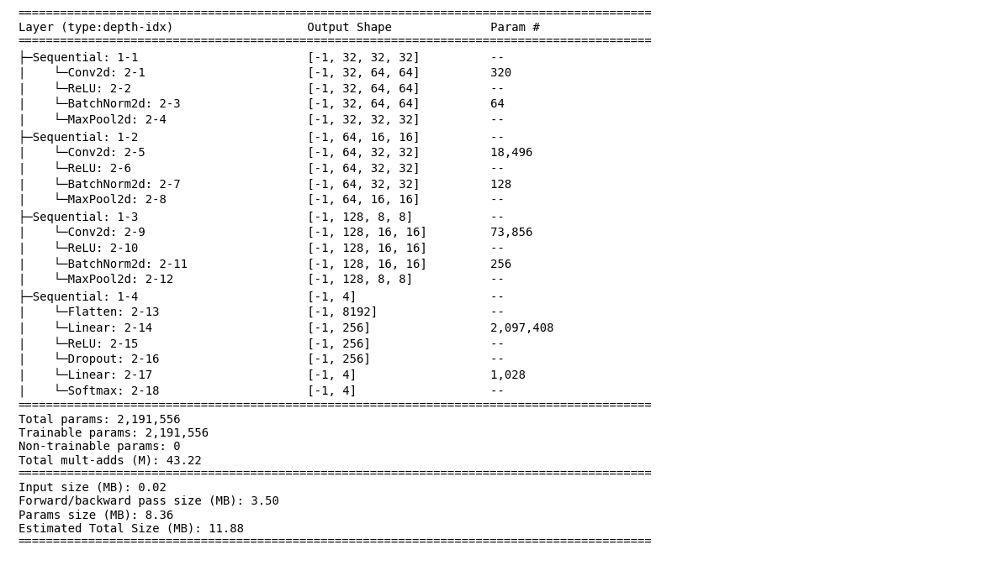

In [16]:
net=CNN(hidden_size, channels_size, class_number).cuda()
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=lr, momentum=m)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
net.to(device)

model_stats = summary(net, (channels_size, img_dim, img_dim),verbose=0)
summary_str = str(model_stats)
plt.figure(figsize=(12,7))
plt.text(0.01, 0.05, summary_str, {'fontsize': 10}, fontproperties = 'monospace') # approach improved by OP -> monospace!
plt.axis('off')
plt.tight_layout()
plt.savefig( results_folder + name_new_folder +'/plots/model_summary.png')

# **Visaulization**

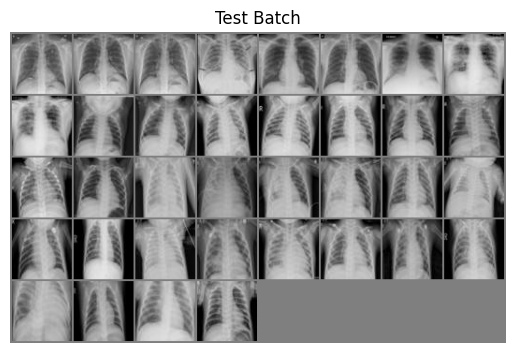

GroundTruth:  covid covid covid covid covid covid covid covid covid normal normal normal normal normal normal normal normal normal pneumonia_bac pneumonia_bac pneumonia_bac pneumonia_bac pneumonia_bac pneumonia_bac pneumonia_bac pneumonia_bac pneumonia_bac pneumonia_vir pneumonia_vir pneumonia_vir pneumonia_vir pneumonia_vir pneumonia_vir pneumonia_vir pneumonia_vir pneumonia_vir


In [14]:

dataiter = iter(testloader)
images_test, labels_test  = next(dataiter)

# print images
imshow(torchvision.utils.make_grid(images_test),type_='test',path= results_folder + name_new_folder +'/plots/test_batch.png')
print('GroundTruth: ', ' '.join('%5s' % classes[labels_test[j]] for j in range(batch_size_test)))

# **Train The Model Without Synthetic images**

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [1]  => Loss: [1.388]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [2]  => Loss: [1.385]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [3]  => Loss: [1.373]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [4]  => Loss: [1.365]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [5]  => Loss: [1.353]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [6]  => Loss: [1.321]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [7]  => Loss: [1.338]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [8]  => Loss: [1.306]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [9]  => Loss: [1.307]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [10]  => Loss: [1.280]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [10]  => Confusion Matrix Test: [1]  => Total Accuracy over 1800 samples: [0.516]


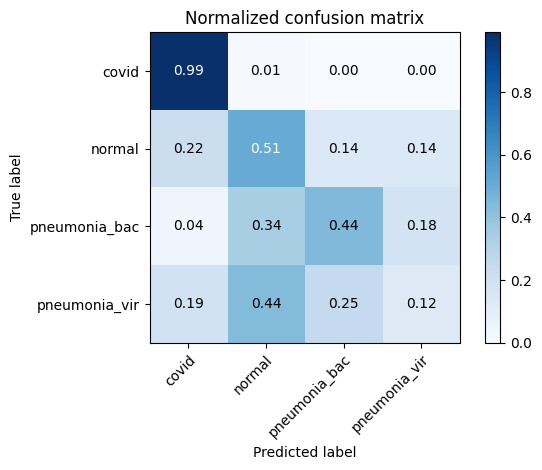

Epoch: [10]  => Evaluation Confusion Matrix Test: [1]
╒══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_10_ep_0.516_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                    │      0.885 │         0.991 │         0.85  │     0.914 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                   │      0.681 │         0.507 │         0.739 │     0.585 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac            │      0.764 │         0.442 │         0.872 │     0.575 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir            │      0.702 │         0.124 │         0.894 │     0.208 │
╘══════════════════════════╧════════════╧═══════════════╧═══════════════╧═══════════╛


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [11]  => Loss: [1.273]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [12]  => Loss: [1.272]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [13]  => Loss: [1.230]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [14]  => Loss: [1.221]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [15]  => Loss: [1.207]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [16]  => Loss: [1.181]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [17]  => Loss: [1.185]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [18]  => Loss: [1.193]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [19]  => Loss: [1.217]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [20]  => Loss: [1.158]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [20]  => Confusion Matrix Test: [2]  => Total Accuracy over 1800 samples: [0.558]


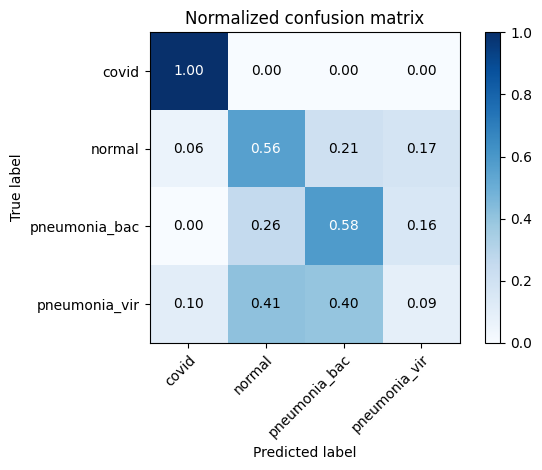

Epoch: [20]  => Evaluation Confusion Matrix Test: [2]
╒══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_20_ep_0.558_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                    │      0.958 │         1     │         0.944 │     0.971 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                   │      0.723 │         0.56  │         0.777 │     0.639 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac            │      0.746 │         0.584 │         0.799 │     0.664 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir            │      0.69  │         0.089 │         0.89  │     0.151 │
╘══════════════════════════╧════════════╧═══════════════╧═══════════════╧═══════════╛


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [21]  => Loss: [1.153]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [22]  => Loss: [1.135]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [23]  => Loss: [1.129]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [24]  => Loss: [1.131]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [25]  => Loss: [1.124]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [26]  => Loss: [1.117]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [27]  => Loss: [1.099]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [28]  => Loss: [1.113]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [29]  => Loss: [1.116]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [30]  => Loss: [1.097]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [30]  => Confusion Matrix Test: [3]  => Total Accuracy over 1800 samples: [0.575]


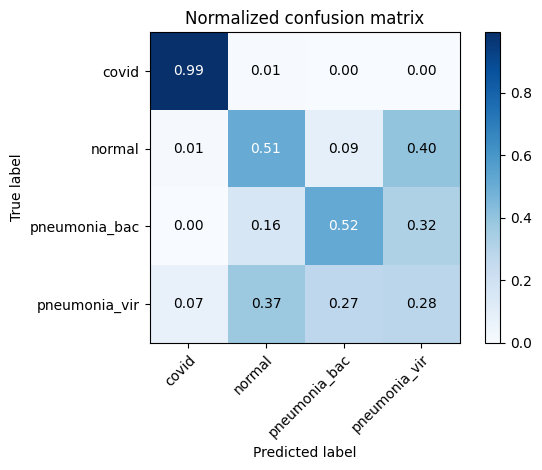

Epoch: [30]  => Evaluation Confusion Matrix Test: [3]
╒══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_30_ep_0.575_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                    │      0.978 │         0.993 │         0.973 │     0.983 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                   │      0.741 │         0.507 │         0.819 │     0.616 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac            │      0.789 │         0.518 │         0.88  │     0.642 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir            │      0.641 │         0.282 │         0.761 │     0.393 │
╘══════════════════════════╧════════════╧═══════════════╧═══════════════╧═══════════╛


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [31]  => Loss: [1.137]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [32]  => Loss: [1.130]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [33]  => Loss: [1.058]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [34]  => Loss: [1.064]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [35]  => Loss: [1.102]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [36]  => Loss: [1.111]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [37]  => Loss: [1.102]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [38]  => Loss: [1.086]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [39]  => Loss: [1.026]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [40]  => Loss: [1.077]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [40]  => Confusion Matrix Test: [4]  => Total Accuracy over 1800 samples: [0.561]


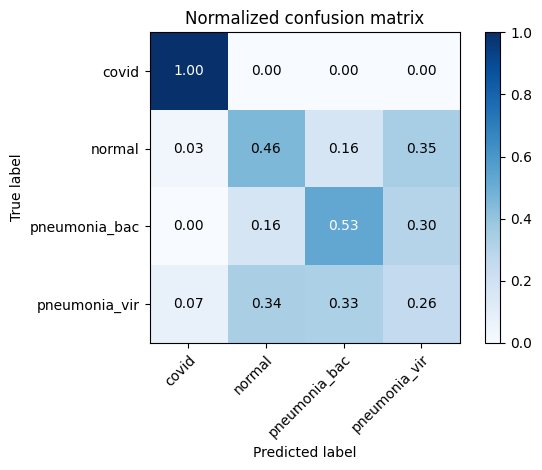

Epoch: [40]  => Evaluation Confusion Matrix Test: [4]
╒══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_40_ep_0.561_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                    │      0.973 │         1     │         0.964 │     0.981 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                   │      0.738 │         0.456 │         0.833 │     0.58  │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac            │      0.759 │         0.531 │         0.835 │     0.64  │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir            │      0.652 │         0.258 │         0.784 │     0.376 │
╘══════════════════════════╧════════════╧═══════════════╧═══════════════╧═══════════╛


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [41]  => Loss: [1.040]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [42]  => Loss: [1.042]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [43]  => Loss: [1.083]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [44]  => Loss: [1.105]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [45]  => Loss: [1.041]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [46]  => Loss: [1.039]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [47]  => Loss: [1.072]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [48]  => Loss: [1.077]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [49]  => Loss: [1.104]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [50]  => Loss: [1.031]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [50]  => Confusion Matrix Test: [5]  => Total Accuracy over 1800 samples: [0.634]


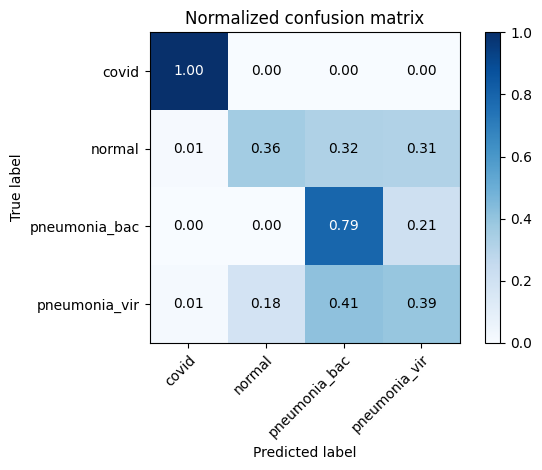

Epoch: [50]  => Evaluation Confusion Matrix Test: [5]
╒══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_50_ep_0.634_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                    │      0.994 │         1     │         0.993 │     0.996 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                   │      0.793 │         0.356 │         0.939 │     0.512 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac            │      0.764 │         0.791 │         0.755 │     0.769 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir            │      0.718 │         0.391 │         0.827 │     0.518 │
╘══════════════════════════╧════════════╧═══════════════╧═══════════════╧═══════════╛


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [51]  => Loss: [1.021]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [52]  => Loss: [1.042]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [53]  => Loss: [1.051]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [54]  => Loss: [1.066]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [55]  => Loss: [1.085]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [56]  => Loss: [1.027]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [57]  => Loss: [1.022]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [58]  => Loss: [1.010]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [59]  => Loss: [1.043]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [60]  => Loss: [1.060]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [60]  => Confusion Matrix Test: [6]  => Total Accuracy over 1800 samples: [0.648]


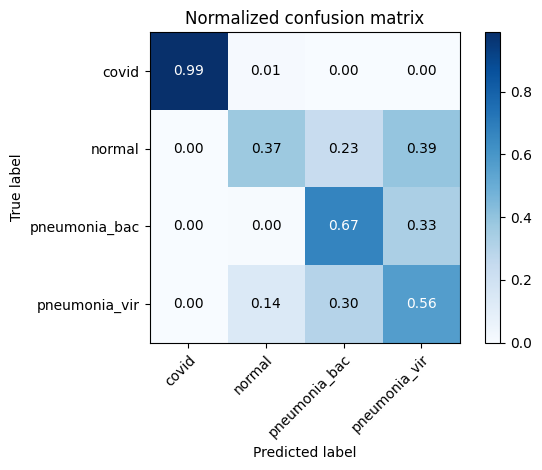

Epoch: [60]  => Evaluation Confusion Matrix Test: [6]
╒══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_60_ep_0.648_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                    │      0.997 │         0.989 │         1     │     0.994 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                   │      0.806 │         0.373 │         0.95  │     0.532 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac            │      0.783 │         0.667 │         0.822 │     0.732 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir            │      0.711 │         0.564 │         0.759 │     0.64  │
╘══════════════════════════╧════════════╧═══════════════╧═══════════════╧═══════════╛


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [61]  => Loss: [0.998]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [62]  => Loss: [1.041]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [63]  => Loss: [1.065]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [64]  => Loss: [1.060]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [65]  => Loss: [1.039]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [66]  => Loss: [1.037]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [67]  => Loss: [1.006]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [68]  => Loss: [1.034]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [69]  => Loss: [1.029]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [70]  => Loss: [1.050]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [70]  => Confusion Matrix Test: [7]  => Total Accuracy over 1800 samples: [0.645]


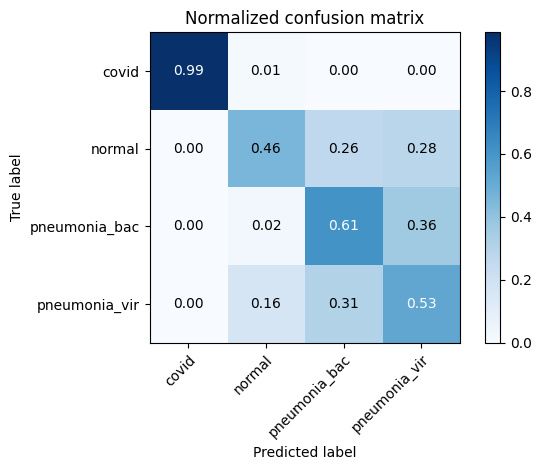

Epoch: [70]  => Evaluation Confusion Matrix Test: [7]
╒══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_70_ep_0.645_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                    │      0.997 │         0.987 │         1     │     0.993 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                   │      0.813 │         0.456 │         0.933 │     0.607 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac            │      0.76  │         0.611 │         0.81  │     0.687 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir            │      0.72  │         0.527 │         0.784 │     0.619 │
╘══════════════════════════╧════════════╧═══════════════╧═══════════════╧═══════════╛


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [71]  => Loss: [1.029]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [72]  => Loss: [0.988]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [73]  => Loss: [0.990]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [74]  => Loss: [1.028]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [75]  => Loss: [0.958]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [76]  => Loss: [1.006]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [77]  => Loss: [1.010]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [78]  => Loss: [1.034]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [79]  => Loss: [0.999]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [80]  => Loss: [0.998]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [80]  => Confusion Matrix Test: [8]  => Total Accuracy over 1800 samples: [0.704]


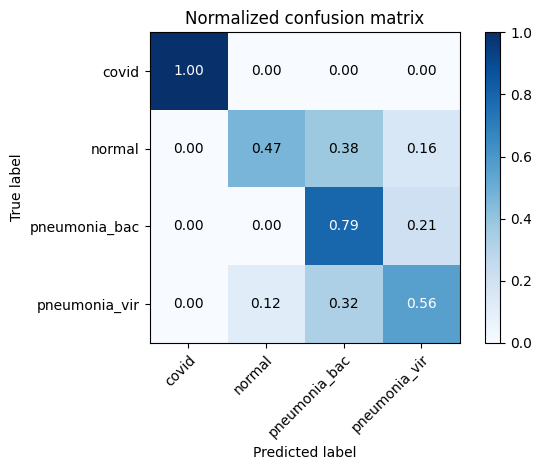

Epoch: [80]  => Evaluation Confusion Matrix Test: [8]
╒══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_80_ep_0.704_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                    │      1     │         1     │         1     │     1     │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                   │      0.837 │         0.467 │         0.961 │     0.623 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac            │      0.772 │         0.791 │         0.766 │     0.775 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir            │      0.799 │         0.56  │         0.879 │     0.678 │
╘══════════════════════════╧════════════╧═══════════════╧═══════════════╧═══════════╛


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [81]  => Loss: [0.962]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [82]  => Loss: [0.969]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [83]  => Loss: [0.975]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [84]  => Loss: [1.001]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [85]  => Loss: [1.019]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [86]  => Loss: [1.006]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [87]  => Loss: [1.031]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [88]  => Loss: [0.981]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [89]  => Loss: [1.019]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [90]  => Loss: [0.993]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [90]  => Confusion Matrix Test: [9]  => Total Accuracy over 1800 samples: [0.691]


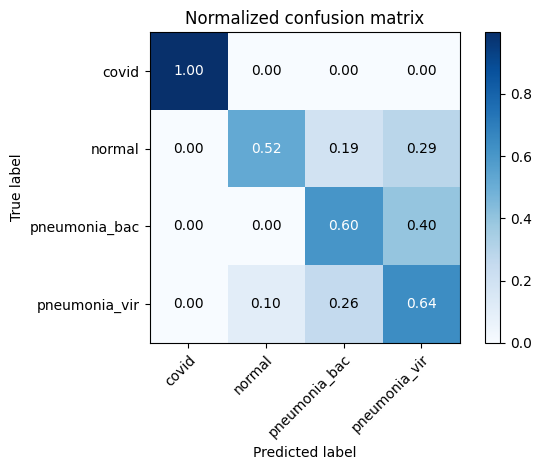

Epoch: [90]  => Evaluation Confusion Matrix Test: [9]
╒══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_90_ep_0.691_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                    │      0.999 │         0.998 │         0.999 │     0.998 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                   │      0.853 │         0.52  │         0.964 │     0.673 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac            │      0.789 │         0.604 │         0.851 │     0.702 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir            │      0.739 │         0.64  │         0.773 │     0.693 │
╘══════════════════════════╧════════════╧═══════════════╧═══════════════╧═══════════╛


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [91]  => Loss: [0.988]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [92]  => Loss: [0.955]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [93]  => Loss: [0.941]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [94]  => Loss: [0.949]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [95]  => Loss: [0.947]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [96]  => Loss: [0.944]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [97]  => Loss: [1.001]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [98]  => Loss: [0.996]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [99]  => Loss: [1.000]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [100]  => Loss: [0.964]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [100]  => Confusion Matrix Test: [10]  => Total Accuracy over 1800 samples: [0.671]


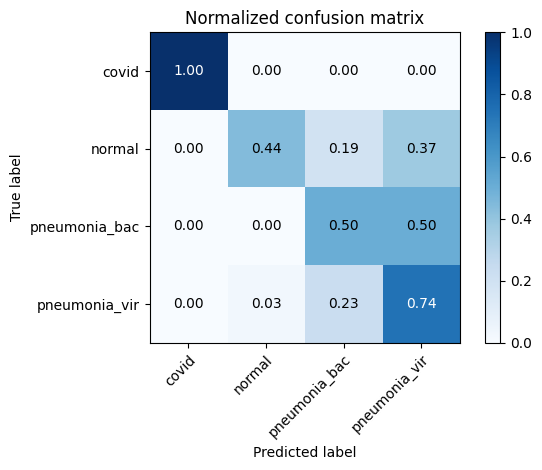

Epoch: [100]  => Evaluation Confusion Matrix Test: [10]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_100_ep_0.671_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      1     │         1     │         1     │     1     │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.853 │         0.44  │         0.99  │     0.606 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.771 │         0.5   │         0.861 │     0.626 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.718 │         0.742 │         0.71  │     0.721 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [101]  => Loss: [0.947]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [102]  => Loss: [0.972]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [103]  => Loss: [0.987]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [104]  => Loss: [0.966]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [105]  => Loss: [0.983]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [106]  => Loss: [1.014]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [107]  => Loss: [0.967]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [108]  => Loss: [0.975]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [109]  => Loss: [1.015]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [110]  => Loss: [0.954]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [110]  => Confusion Matrix Test: [11]  => Total Accuracy over 1800 samples: [0.661]


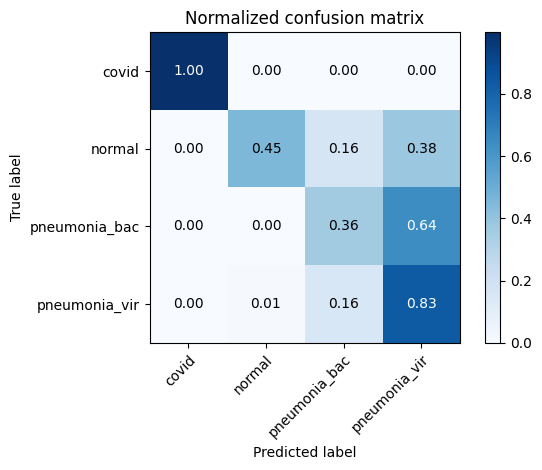

Epoch: [110]  => Evaluation Confusion Matrix Test: [11]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_110_ep_0.661_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.999 │         0.998 │         0.999 │     0.998 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.86  │         0.453 │         0.996 │     0.618 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.76  │         0.36  │         0.893 │     0.505 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.703 │         0.833 │         0.66  │     0.734 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [111]  => Loss: [0.973]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [112]  => Loss: [0.988]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [113]  => Loss: [0.946]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [114]  => Loss: [0.950]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [115]  => Loss: [1.006]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [116]  => Loss: [0.961]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [117]  => Loss: [0.938]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [118]  => Loss: [0.950]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [119]  => Loss: [0.941]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [120]  => Loss: [0.950]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [120]  => Confusion Matrix Test: [12]  => Total Accuracy over 1800 samples: [0.703]


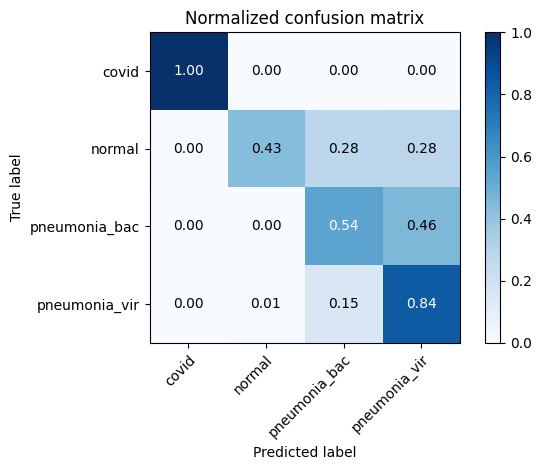

Epoch: [120]  => Evaluation Confusion Matrix Test: [12]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_120_ep_0.703_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.999 │         1     │         0.999 │     0.999 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.855 │         0.433 │         0.996 │     0.599 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.779 │         0.544 │         0.857 │     0.658 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.774 │         0.836 │         0.753 │     0.789 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [121]  => Loss: [0.952]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [122]  => Loss: [0.934]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [123]  => Loss: [0.960]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [124]  => Loss: [0.961]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [125]  => Loss: [0.967]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [126]  => Loss: [0.930]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [127]  => Loss: [0.950]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [128]  => Loss: [0.939]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [129]  => Loss: [0.929]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [130]  => Loss: [0.947]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [130]  => Confusion Matrix Test: [13]  => Total Accuracy over 1800 samples: [0.665]


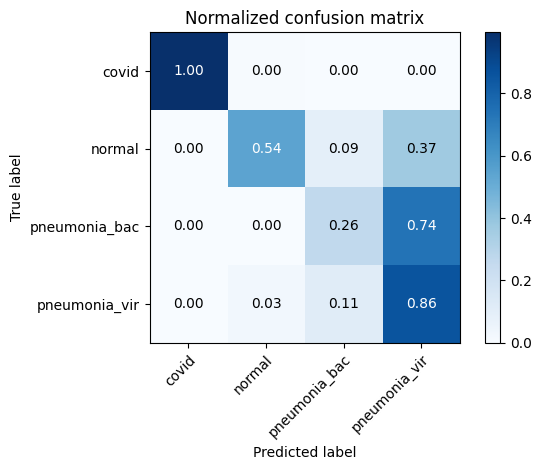

Epoch: [130]  => Evaluation Confusion Matrix Test: [13]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_130_ep_0.665_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.999 │         0.996 │         1     │     0.998 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.877 │         0.542 │         0.989 │     0.698 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.765 │         0.264 │         0.932 │     0.401 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.689 │         0.858 │         0.633 │     0.727 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [131]  => Loss: [0.946]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [132]  => Loss: [0.948]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [133]  => Loss: [0.905]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [134]  => Loss: [0.928]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [135]  => Loss: [0.934]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [136]  => Loss: [0.944]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [137]  => Loss: [0.974]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [138]  => Loss: [0.961]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [139]  => Loss: [0.956]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [140]  => Loss: [0.980]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [140]  => Confusion Matrix Test: [14]  => Total Accuracy over 1800 samples: [0.732]


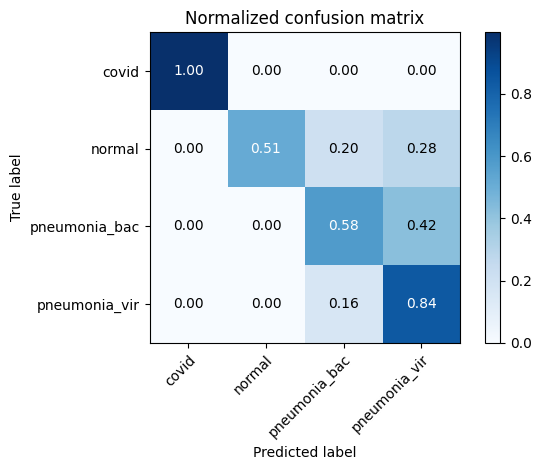

Epoch: [140]  => Evaluation Confusion Matrix Test: [14]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_140_ep_0.732_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.999 │         0.998 │         0.999 │     0.998 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.877 │         0.513 │         0.999 │     0.672 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.804 │         0.578 │         0.879 │     0.694 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.784 │         0.84  │         0.766 │     0.799 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [141]  => Loss: [0.953]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [142]  => Loss: [0.933]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [143]  => Loss: [0.931]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [144]  => Loss: [0.913]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [145]  => Loss: [0.929]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [146]  => Loss: [0.956]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [147]  => Loss: [0.932]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [148]  => Loss: [0.966]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [149]  => Loss: [0.939]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [150]  => Loss: [0.936]


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: [150]  => Confusion Matrix Test: [15]  => Total Accuracy over 18000 samples: [0.692]


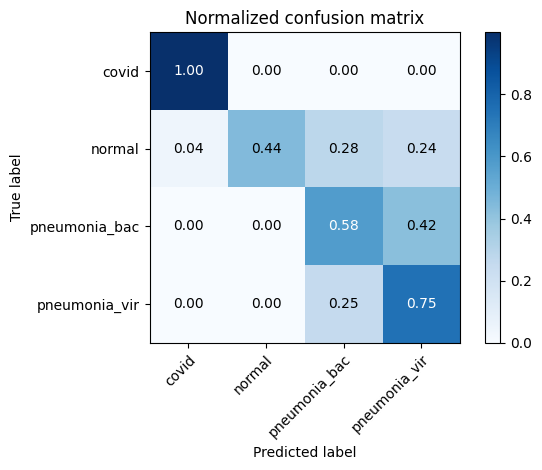

Epoch: [150]  => Evaluation Confusion Matrix Test: [15]


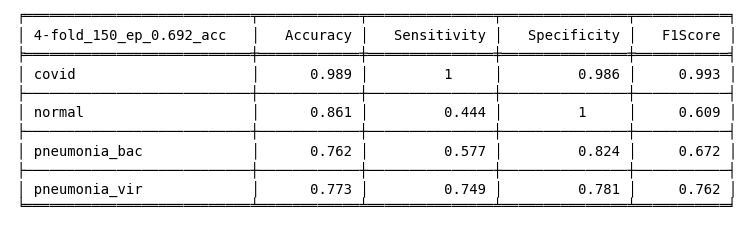

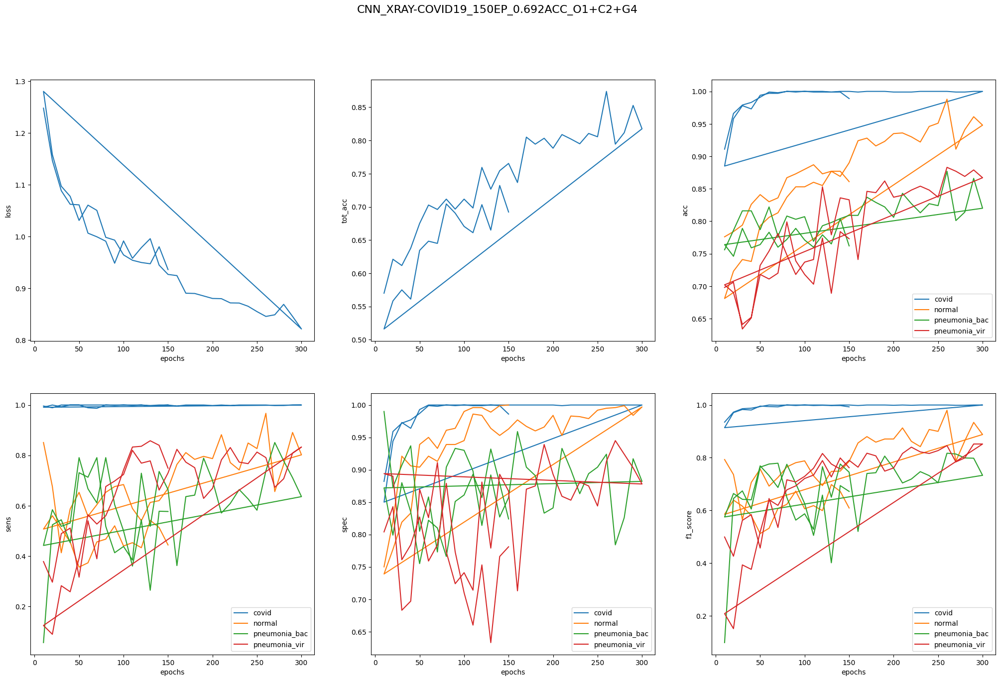

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [151]  => Loss: [0.934]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [152]  => Loss: [0.911]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [153]  => Loss: [0.911]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [154]  => Loss: [0.914]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [155]  => Loss: [0.925]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [156]  => Loss: [0.952]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [157]  => Loss: [0.901]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [158]  => Loss: [0.935]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [159]  => Loss: [0.929]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [160]  => Loss: [0.946]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [160]  => Confusion Matrix Test: [16]  => Total Accuracy over 1800 samples: [0.727]


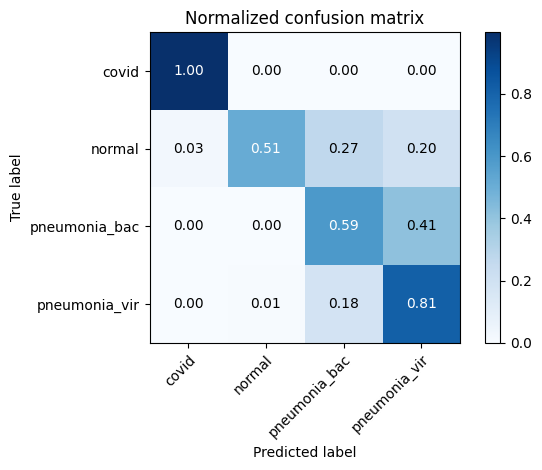

Epoch: [160]  => Evaluation Confusion Matrix Test: [16]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_160_ep_0.727_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.993 │         0.998 │         0.991 │     0.994 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.875 │         0.509 │         0.997 │     0.671 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.785 │         0.589 │         0.85  │     0.692 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.802 │         0.813 │         0.798 │     0.804 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [161]  => Loss: [0.920]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [162]  => Loss: [0.933]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [163]  => Loss: [0.931]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [164]  => Loss: [0.930]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [165]  => Loss: [0.938]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [166]  => Loss: [0.895]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [167]  => Loss: [0.918]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [168]  => Loss: [0.906]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [169]  => Loss: [0.910]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [170]  => Loss: [0.946]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [170]  => Confusion Matrix Test: [17]  => Total Accuracy over 1800 samples: [0.732]


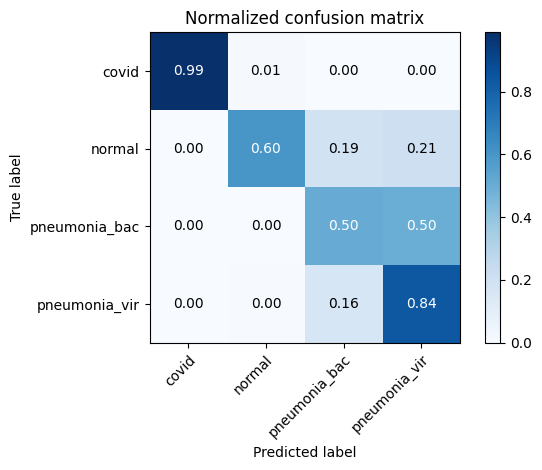

Epoch: [170]  => Evaluation Confusion Matrix Test: [17]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_170_ep_0.732_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.997 │         0.989 │         0.999 │     0.994 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.895 │         0.596 │         0.995 │     0.742 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.789 │         0.504 │         0.884 │     0.635 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.783 │         0.838 │         0.764 │     0.798 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [171]  => Loss: [0.928]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [172]  => Loss: [0.916]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [173]  => Loss: [0.899]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [174]  => Loss: [0.918]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [175]  => Loss: [0.916]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [176]  => Loss: [0.904]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [177]  => Loss: [0.918]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [178]  => Loss: [0.893]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [179]  => Loss: [0.868]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [180]  => Loss: [0.905]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [180]  => Confusion Matrix Test: [18]  => Total Accuracy over 1800 samples: [0.706]


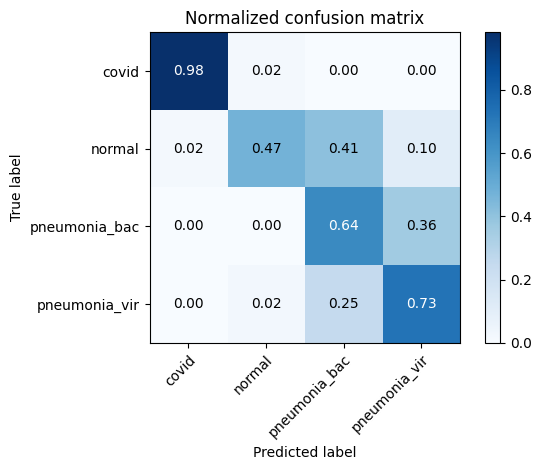

Epoch: [180]  => Evaluation Confusion Matrix Test: [18]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_180_ep_0.706_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.992 │         0.982 │         0.995 │     0.988 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.857 │         0.471 │         0.986 │     0.633 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.747 │         0.642 │         0.781 │     0.701 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.817 │         0.729 │         0.846 │     0.779 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [181]  => Loss: [0.892]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [182]  => Loss: [0.927]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [183]  => Loss: [0.901]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [184]  => Loss: [0.892]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [185]  => Loss: [0.888]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [186]  => Loss: [0.910]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [187]  => Loss: [0.896]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [188]  => Loss: [0.876]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [189]  => Loss: [0.896]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [190]  => Loss: [0.904]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [190]  => Confusion Matrix Test: [19]  => Total Accuracy over 1800 samples: [0.729]


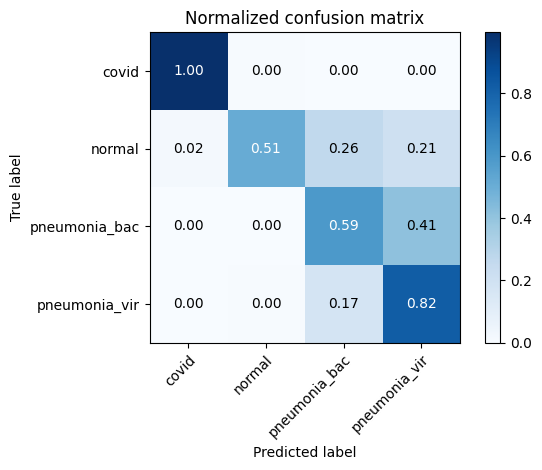

Epoch: [190]  => Evaluation Confusion Matrix Test: [19]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_190_ep_0.729_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.993 │         0.996 │         0.993 │     0.994 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.875 │         0.509 │         0.997 │     0.669 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.788 │         0.589 │         0.855 │     0.693 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.801 │         0.822 │         0.794 │     0.805 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [191]  => Loss: [0.873]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [192]  => Loss: [0.905]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [193]  => Loss: [0.891]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [194]  => Loss: [0.887]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [195]  => Loss: [0.890]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [196]  => Loss: [0.893]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [197]  => Loss: [0.887]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [198]  => Loss: [0.900]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [199]  => Loss: [0.870]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [200]  => Loss: [0.868]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [200]  => Confusion Matrix Test: [20]  => Total Accuracy over 1800 samples: [0.744]


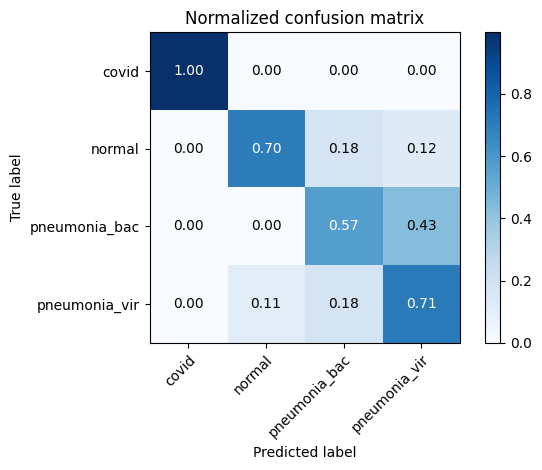

Epoch: [200]  => Evaluation Confusion Matrix Test: [20]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_200_ep_0.744_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.999 │         0.998 │         1     │     0.999 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.896 │         0.7   │         0.961 │     0.806 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.803 │         0.567 │         0.881 │     0.685 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.789 │         0.711 │         0.816 │     0.755 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [201]  => Loss: [0.875]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [202]  => Loss: [0.877]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [203]  => Loss: [0.905]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [204]  => Loss: [0.908]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [205]  => Loss: [0.893]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [206]  => Loss: [0.854]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [207]  => Loss: [0.886]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [208]  => Loss: [0.868]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [209]  => Loss: [0.890]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [210]  => Loss: [0.916]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [210]  => Confusion Matrix Test: [21]  => Total Accuracy over 1800 samples: [0.737]


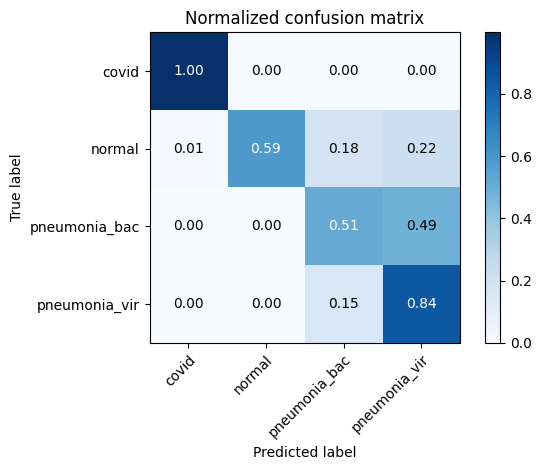

Epoch: [210]  => Evaluation Confusion Matrix Test: [21]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_210_ep_0.737_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.997 │         0.998 │         0.997 │     0.997 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.897 │         0.591 │         0.999 │     0.738 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.794 │         0.513 │         0.888 │     0.648 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.785 │         0.844 │         0.765 │     0.802 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [211]  => Loss: [0.888]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [212]  => Loss: [0.852]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [213]  => Loss: [0.878]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [214]  => Loss: [0.893]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [215]  => Loss: [0.886]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [216]  => Loss: [0.887]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [217]  => Loss: [0.859]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [218]  => Loss: [0.888]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [219]  => Loss: [0.879]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [220]  => Loss: [0.850]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [220]  => Confusion Matrix Test: [22]  => Total Accuracy over 1800 samples: [0.743]


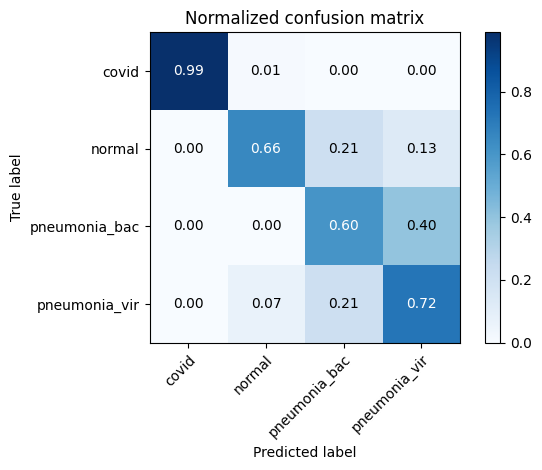

Epoch: [220]  => Evaluation Confusion Matrix Test: [22]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_220_ep_0.743_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.997 │         0.989 │         0.999 │     0.994 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.894 │         0.656 │         0.974 │     0.779 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.796 │         0.604 │         0.86  │     0.705 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.799 │         0.724 │         0.824 │     0.765 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [221]  => Loss: [0.899]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [222]  => Loss: [0.861]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [223]  => Loss: [0.901]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [224]  => Loss: [0.878]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [225]  => Loss: [0.878]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [226]  => Loss: [0.860]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [227]  => Loss: [0.892]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [228]  => Loss: [0.896]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [229]  => Loss: [0.900]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [230]  => Loss: [0.877]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [230]  => Confusion Matrix Test: [23]  => Total Accuracy over 1800 samples: [0.714]


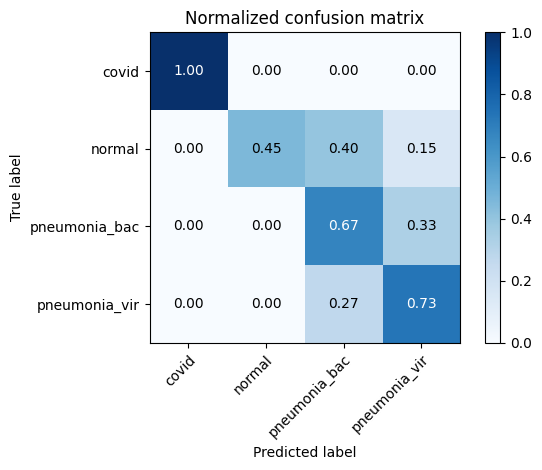

Epoch: [230]  => Evaluation Confusion Matrix Test: [23]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_230_ep_0.714_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.999 │         1     │         0.999 │     1     │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.863 │         0.453 │         1     │     0.619 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.752 │         0.673 │         0.779 │     0.719 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.814 │         0.731 │         0.841 │     0.779 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [231]  => Loss: [0.882]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [232]  => Loss: [0.905]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [233]  => Loss: [0.900]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [234]  => Loss: [0.896]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [235]  => Loss: [0.879]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [236]  => Loss: [0.896]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [237]  => Loss: [0.888]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [238]  => Loss: [0.874]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [239]  => Loss: [0.913]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [240]  => Loss: [0.876]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [240]  => Confusion Matrix Test: [24]  => Total Accuracy over 1800 samples: [0.723]


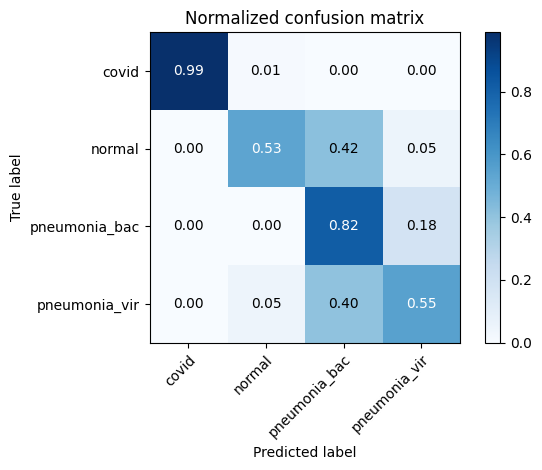

Epoch: [240]  => Evaluation Confusion Matrix Test: [24]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_240_ep_0.723_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.997 │         0.989 │         1     │     0.994 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.868 │         0.533 │         0.98  │     0.688 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.75  │         0.818 │         0.727 │     0.767 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.83  │         0.551 │         0.923 │     0.684 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [241]  => Loss: [0.900]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [242]  => Loss: [0.900]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [243]  => Loss: [0.882]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [244]  => Loss: [0.882]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [245]  => Loss: [0.853]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [246]  => Loss: [0.860]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [247]  => Loss: [0.888]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [248]  => Loss: [0.898]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [249]  => Loss: [0.907]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [250]  => Loss: [0.855]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [250]  => Confusion Matrix Test: [25]  => Total Accuracy over 1800 samples: [0.731]


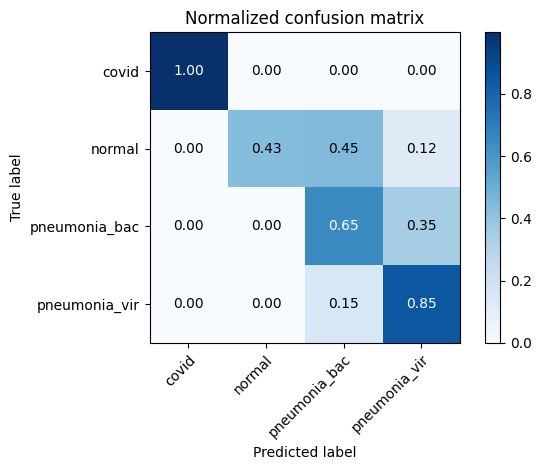

Epoch: [250]  => Evaluation Confusion Matrix Test: [25]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_250_ep_0.731_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.999 │         0.998 │         1     │     0.999 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.857 │         0.431 │         0.999 │     0.599 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.762 │         0.649 │         0.8   │     0.714 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.843 │         0.847 │         0.842 │     0.842 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [251]  => Loss: [0.879]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [252]  => Loss: [0.911]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [253]  => Loss: [0.899]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [254]  => Loss: [0.874]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [255]  => Loss: [0.856]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [256]  => Loss: [0.885]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [257]  => Loss: [0.890]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [258]  => Loss: [0.925]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [259]  => Loss: [0.880]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [260]  => Loss: [0.886]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [260]  => Confusion Matrix Test: [26]  => Total Accuracy over 1800 samples: [0.728]


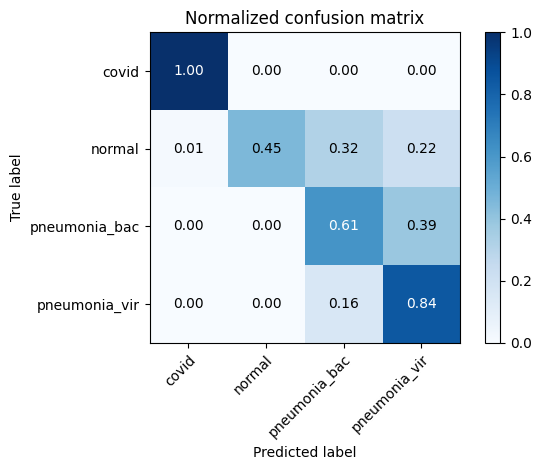

Epoch: [260]  => Evaluation Confusion Matrix Test: [26]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_260_ep_0.728_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.997 │         1     │         0.996 │     0.998 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.863 │         0.453 │         1     │     0.621 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.786 │         0.613 │         0.843 │     0.707 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.81  │         0.844 │         0.799 │     0.819 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [261]  => Loss: [0.852]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [262]  => Loss: [0.857]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [263]  => Loss: [0.862]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [264]  => Loss: [0.860]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [265]  => Loss: [0.835]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [266]  => Loss: [0.853]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [267]  => Loss: [0.853]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [268]  => Loss: [0.850]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [269]  => Loss: [0.895]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [270]  => Loss: [0.831]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [270]  => Confusion Matrix Test: [27]  => Total Accuracy over 1800 samples: [0.787]


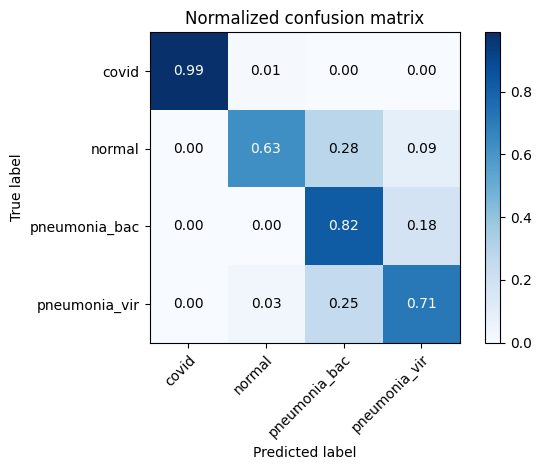

Epoch: [270]  => Evaluation Confusion Matrix Test: [27]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_270_ep_0.787_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.997 │         0.989 │         1     │     0.994 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.896 │         0.627 │         0.985 │     0.762 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.821 │         0.82  │         0.821 │     0.818 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.861 │         0.713 │         0.91  │     0.795 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [271]  => Loss: [0.849]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [272]  => Loss: [0.867]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [273]  => Loss: [0.872]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [274]  => Loss: [0.890]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [275]  => Loss: [0.865]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [276]  => Loss: [0.845]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [277]  => Loss: [0.824]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [278]  => Loss: [0.862]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [279]  => Loss: [0.853]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [280]  => Loss: [0.833]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [280]  => Confusion Matrix Test: [28]  => Total Accuracy over 1800 samples: [0.786]


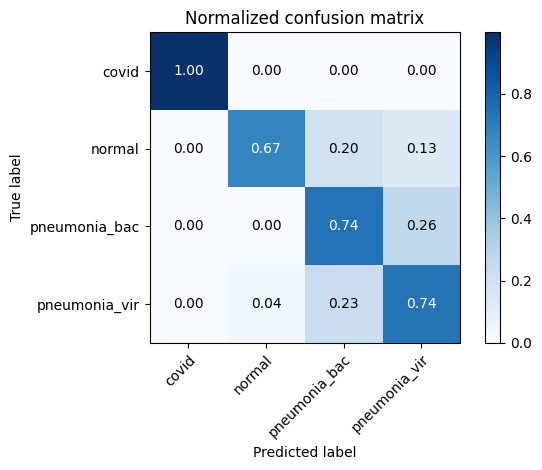

Epoch: [280]  => Evaluation Confusion Matrix Test: [28]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_280_ep_0.786_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.999 │         0.998 │         1     │     0.999 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.908 │         0.673 │         0.987 │     0.797 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.828 │         0.738 │         0.859 │     0.791 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.836 │         0.736 │         0.87  │     0.793 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [281]  => Loss: [0.863]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [282]  => Loss: [0.876]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [283]  => Loss: [0.849]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [284]  => Loss: [0.850]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [285]  => Loss: [0.834]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [286]  => Loss: [0.861]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [287]  => Loss: [0.842]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [288]  => Loss: [0.818]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [289]  => Loss: [0.849]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [290]  => Loss: [0.843]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [290]  => Confusion Matrix Test: [29]  => Total Accuracy over 1800 samples: [0.806]


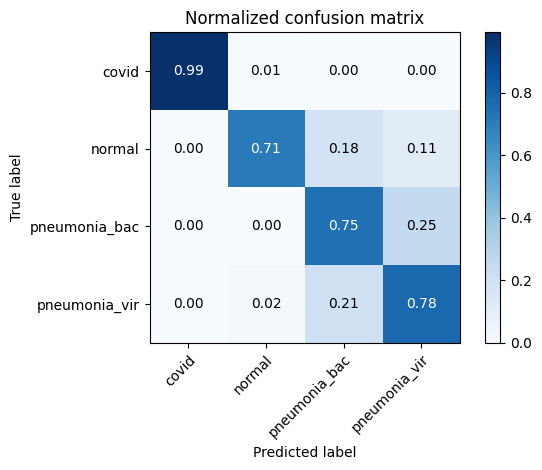

Epoch: [290]  => Evaluation Confusion Matrix Test: [29]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_290_ep_0.806_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.998 │         0.993 │         0.999 │     0.996 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.921 │         0.709 │         0.992 │     0.821 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.84  │         0.747 │         0.871 │     0.801 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.853 │         0.776 │         0.879 │     0.82  │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [291]  => Loss: [0.848]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [292]  => Loss: [0.864]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [293]  => Loss: [0.826]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [294]  => Loss: [0.818]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [295]  => Loss: [0.827]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [296]  => Loss: [0.796]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [297]  => Loss: [0.851]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [298]  => Loss: [0.812]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [299]  => Loss: [0.836]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [300]  => Loss: [0.833]


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: [300]  => Confusion Matrix Test: [30]  => Total Accuracy over 18000 samples: [0.780]


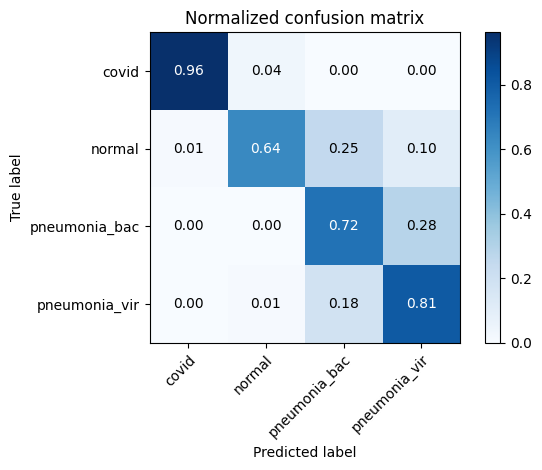

Epoch: [300]  => Evaluation Confusion Matrix Test: [30]


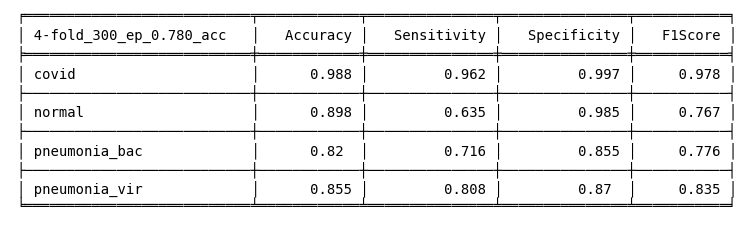

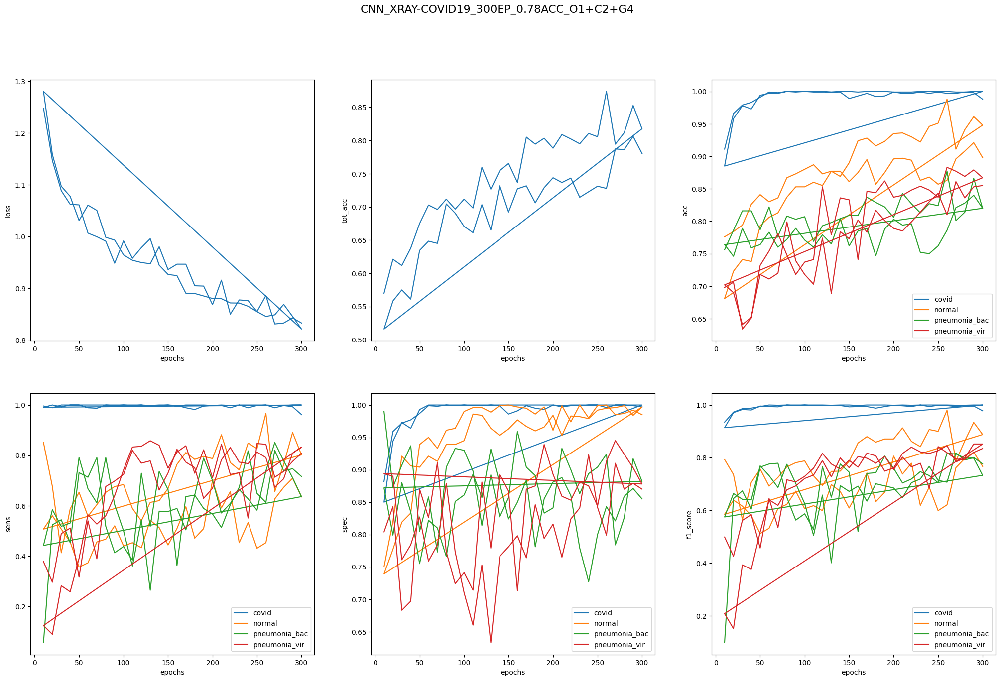

Finished Training


In [36]:
net=CNN(hidden_size, channels_size, class_number).cuda()
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=lr, momentum=m)

listtrainset = listtrainset_classic  

trainset_concat = torch.utils.data.ConcatDataset(listtrainset)

sampler = torch.utils.data.RandomSampler(trainset_concat,replacement=True, num_samples=num_samples)

trainloader = torch.utils.data.DataLoader(trainset_concat,  sampler=sampler,
                                          batch_size=batch_size_train, drop_last=True)

for epoch in range(epochs):  # loop over the dataset multiple times

    running_loss = 0.0
    for data in notebook.tqdm(trainloader):
        # get the inputs; data is a list of [inputs, labels]
        
        gc.collect()
        if torch.cuda.is_available():
            inputs, labels = data[0].cuda(), data[1].cuda()  
        else:
            inputs, labels = data[0].to(device), data[1].to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
    print("Epoch: [%d]"%(epoch + 1),' => Loss: [%.3f]' %(running_loss / len(trainloader)))
    if (epoch+1)%10==0:
        with torch.no_grad():
            metrics['loss'].append([epoch+1, (running_loss / len(trainloader))])
            accuracy_tot = list(0. for i in range(len(classes)))
            sensitivity_tot = list(0. for i in range(len(classes)))
            specificity_tot = list(0. for i in range(len(classes)))
            f1score_tot = list(0. for i in range(len(classes)))
            table = list(0. for i in range(len(classes)))
            tot_acc_tot=0

            iterations=50
            if (epoch+1)%150==0:
              iterations=500
  
            labels_tot=np.array([],dtype=np.uint8)
            predicted_tot=np.array([],dtype=np.uint8)

            for i in notebook.tqdm(range(iterations)):

              dataiter = iter(testloader)
              images, labels = next(dataiter)

       

              outputs = net(images.to(device))

              _, predicted = torch.max(outputs, 1)

              labels_tot=np.append(labels_tot,labels.cpu().detach().numpy())
              predicted_tot=np.append(predicted_tot,predicted.cpu().detach().numpy())

              cm = confusion_matrix(labels.cpu().detach().numpy(), predicted.cpu().detach().numpy(), labels=None, sample_weight=None)

              tot_acc=np.trace(cm)/np.sum(cm)

              tot_acc_tot+=tot_acc

              sensitivity = list(0. for i in range(cm.shape[0]))
              specificity = list(0. for i in range(cm.shape[0]))
              accuracy = list(0. for i in range(cm.shape[0]))
              f1score = list(0. for i in range(cm.shape[0]))

              for i in range(cm.shape[0]):
                TP = cm[i,i]
                FN = np.sum(cm[i,:]) - TP
                FP = np.sum(cm[:,i]) - TP
                TN = (np.sum(cm) - TP - FP - FN)
                accuracy[i] = (TP + TN) / (TP + TN + FP + FN) 
                sensitivity[i] = TP / (TP + FN) 
                specificity[i] = TN / (TN + FP) 
                f1score[i]= 2 * (specificity[i] * sensitivity[i]) / (specificity[i] + sensitivity[i])
              accuracy_tot = [sum(x) for x in zip(accuracy_tot, accuracy)]
              specificity_tot = [sum(x) for x in zip(specificity_tot, specificity)]
              sensitivity_tot = [sum(x) for x in zip(sensitivity_tot, sensitivity)]
              f1score_tot = [sum(x) for x in zip(f1score_tot, f1score)]
              
            accuracy_tot = [round((x/iterations),3) for x in accuracy_tot]
            specificity_tot = [round((x/iterations),3) for x in specificity_tot]
            sensitivity_tot = [round((x/iterations),3) for x in sensitivity_tot]
            f1score_tot = [round((x/iterations),3) for x in f1score_tot]
            tot_acc_tot/=iterations
            running_loss/=(iterations*len(testloader))

            metrics['tot_acc'].append([epoch+1, tot_acc_tot])
            metrics['acc'].append([epoch+1, accuracy_tot])
            metrics['spec'].append([epoch+1, specificity_tot])
            metrics['sens'].append([epoch+1, sensitivity_tot])
            metrics['f1_score'].append([epoch+1, f1score_tot])

            table=[classes, accuracy_tot, sensitivity_tot, specificity_tot, f1score_tot]
            table=np.array(table).T.tolist()

            plot_confusion_matrix(labels_tot, predicted_tot, classes=np.asarray(classes), normalize=True)
            
            print("Epoch: [%d]"%(epoch + 1)," => Confusion Matrix Test: [%d]" %(int((epoch+1)/10))," => Total Accuracy over %d samples: [%.3f]" %(len(testloader.dataset)*iterations, tot_acc_tot))

            if (epoch+1)%150==0:
              plt.gcf().savefig( results_folder + name_new_folder +'/plots/confusion_matrix_%d_ep_%.3f_acc.png' % ((epoch + 1),tot_acc_tot))
            
            plt.show()

            print("Epoch: [%d]"%(epoch + 1)," => Evaluation Confusion Matrix Test: [%d]" %(int((epoch+1)/10)))

            tab = tabulate(table, headers=['%d-fold_%d_ep_%.3f_acc' % (len(classes),(epoch + 1),tot_acc_tot),'Accuracy','Sensitivity', 'Specificity', 'F1Score'], tablefmt='fancy_grid')

            if (epoch+1)%150==0:
              plt.figure(figsize=(8,2.5))
              plt.text(0.01, 0.05, tab, {'fontsize': 10}, fontproperties = 'monospace') 
              plt.axis('off')
              plt.tight_layout()
              plt.savefig( results_folder + name_new_folder +'/plots/k_fold_%d_ep_%.3f_acc.png' % ((epoch + 1),tot_acc_tot))
              plt.show()
            else:
              print(tab)

            if (epoch+1)%150==0:
              PATH = results_folder + name_new_folder +'/models/'
              NAME = 'CNN_XRAY-COVID19_'+str(epoch+1)+'EP_'+str(round(tot_acc_tot,3))+'ACC_O'+str(len(listtrainset_no_aug))+'+C'+str(len(listtrainset_classic))+'+G'+str(len(listtrainset_gan))
              EXT = '.pth'
              states = {
                      'state_dict': net.state_dict(),
                      'optimizer': optimizer.state_dict(),
                      'device': device,
                      'classes': classes,
                      'metrics': metrics,
                      'train_epoch': epoch+1,
                      'dataset_code': 'O'+str(len(listtrainset_no_aug))+'+C'+str(len(listtrainset_classic))+'+G'+str(len(listtrainset_gan)),
                      'dataset_length': len(trainloader.dataset),
                      'batch': num_samples,
                      'mini-batch': batch_size_train,
                      'img_dim': (img_dim,img_dim,channels_size),
                      'date': dt.datetime.now().strftime("%Y-%m-%d_%H:%M:%S"),
              }
              torch.save(states, PATH+NAME+EXT)
              fig = plt.figure(figsize=(25,15))
              fig.suptitle(NAME, fontsize=16)
              fig.subplots_adjust(hspace=0.2, wspace=0.2)
              for i in range(1, len(METRIC_FIELDS)+1):
                  ax = fig.add_subplot(2, 3, i)
                  if type(metrics[METRIC_FIELDS[i-1]][1][1])==list:
                    for j in range(len(classes)):
                      ax.plot([x[0] for x in metrics[METRIC_FIELDS[i-1]]],[x[1][j] for x in metrics[METRIC_FIELDS[i-1]]], label=classes[j])
                    ax.legend()
                  else:
                    ax.plot([x[0] for x in metrics[METRIC_FIELDS[i-1]]],[x[1] for x in metrics[METRIC_FIELDS[i-1]]])
                  ax.set(ylabel=METRIC_FIELDS[i-1],xlabel='epochs')
              get_fig = plt.gcf()
              get_fig.savefig( results_folder + name_new_folder +'/plots/%s.png' % (NAME))
              plt.show()

            if (epoch)%300==0:
              clear_output()
              
    running_loss = 0.0
print('Finished Training')


# **Train The Model With Synthetic images**

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [1]  => Loss: [1.394]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [2]  => Loss: [1.392]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [3]  => Loss: [1.369]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [4]  => Loss: [1.371]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [5]  => Loss: [1.351]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [6]  => Loss: [1.348]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [7]  => Loss: [1.330]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [8]  => Loss: [1.313]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [9]  => Loss: [1.278]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [10]  => Loss: [1.248]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [10]  => Confusion Matrix Test: [1]  => Total Accuracy over 1800 samples: [0.570]


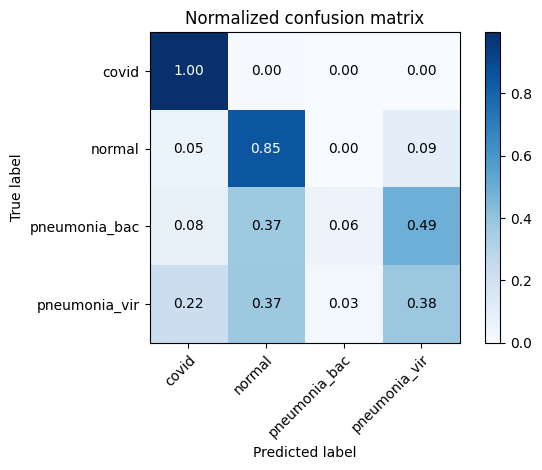

Epoch: [10]  => Evaluation Confusion Matrix Test: [1]
╒══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_10_ep_0.570_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                    │      0.911 │         0.996 │         0.882 │     0.935 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                   │      0.776 │         0.851 │         0.75  │     0.793 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac            │      0.756 │         0.056 │         0.99  │     0.098 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir            │      0.698 │         0.378 │         0.804 │     0.499 │
╘══════════════════════════╧════════════╧═══════════════╧═══════════════╧═══════════╛


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [11]  => Loss: [1.259]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [12]  => Loss: [1.241]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [13]  => Loss: [1.211]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [14]  => Loss: [1.207]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [15]  => Loss: [1.192]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [16]  => Loss: [1.179]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [17]  => Loss: [1.140]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [18]  => Loss: [1.191]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [19]  => Loss: [1.130]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [20]  => Loss: [1.146]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [20]  => Confusion Matrix Test: [2]  => Total Accuracy over 1800 samples: [0.621]


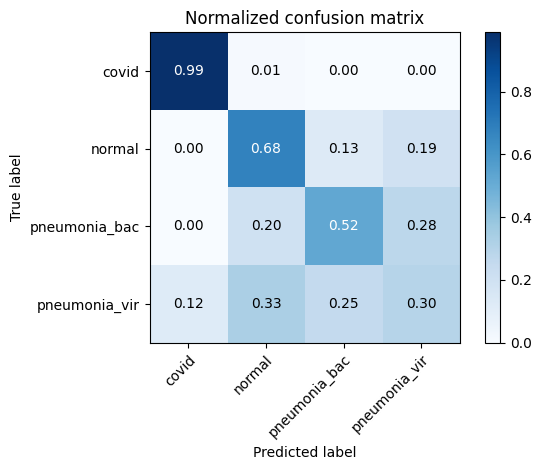

Epoch: [20]  => Evaluation Confusion Matrix Test: [2]
╒══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_20_ep_0.621_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                    │      0.966 │         0.989 │         0.959 │     0.973 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                   │      0.784 │         0.676 │         0.82  │     0.736 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac            │      0.786 │         0.524 │         0.873 │     0.645 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir            │      0.706 │         0.296 │         0.843 │     0.426 │
╘══════════════════════════╧════════════╧═══════════════╧═══════════════╧═══════════╛


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [21]  => Loss: [1.109]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [22]  => Loss: [1.139]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [23]  => Loss: [1.092]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [24]  => Loss: [1.094]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [25]  => Loss: [1.114]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [26]  => Loss: [1.110]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [27]  => Loss: [1.084]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [28]  => Loss: [1.088]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [29]  => Loss: [1.045]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [30]  => Loss: [1.088]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [30]  => Confusion Matrix Test: [3]  => Total Accuracy over 1800 samples: [0.612]


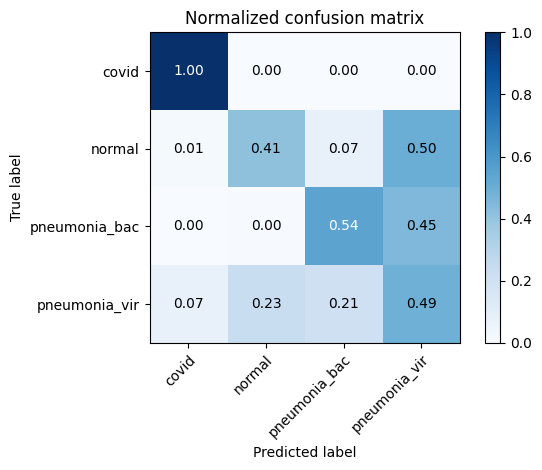

Epoch: [30]  => Evaluation Confusion Matrix Test: [3]
╒══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_30_ep_0.612_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                    │      0.979 │         1     │         0.972 │     0.986 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                   │      0.794 │         0.413 │         0.921 │     0.565 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac            │      0.816 │         0.544 │         0.907 │     0.674 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir            │      0.634 │         0.489 │         0.683 │     0.562 │
╘══════════════════════════╧════════════╧═══════════════╧═══════════════╧═══════════╛


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [31]  => Loss: [1.100]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [32]  => Loss: [1.115]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [33]  => Loss: [1.101]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [34]  => Loss: [1.087]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [35]  => Loss: [1.051]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [36]  => Loss: [1.030]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [37]  => Loss: [1.065]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [38]  => Loss: [1.074]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [39]  => Loss: [1.072]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [40]  => Loss: [1.062]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [40]  => Confusion Matrix Test: [4]  => Total Accuracy over 1800 samples: [0.638]


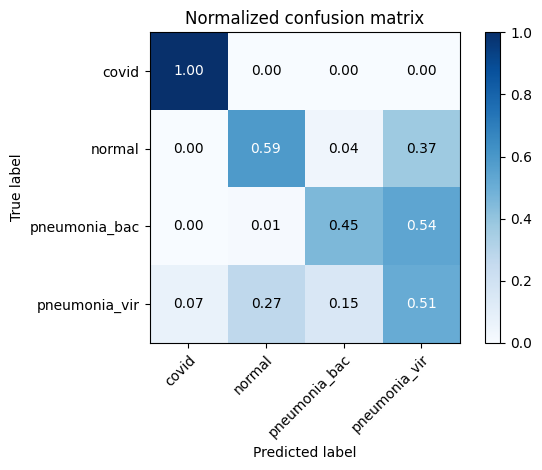

Epoch: [40]  => Evaluation Confusion Matrix Test: [4]
╒══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_40_ep_0.638_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                    │      0.983 │         1     │         0.977 │     0.988 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                   │      0.826 │         0.587 │         0.906 │     0.706 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac            │      0.816 │         0.453 │         0.937 │     0.605 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir            │      0.651 │         0.511 │         0.697 │     0.584 │
╘══════════════════════════╧════════════╧═══════════════╧═══════════════╧═══════════╛


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [41]  => Loss: [1.078]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [42]  => Loss: [1.058]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [43]  => Loss: [1.032]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [44]  => Loss: [1.032]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [45]  => Loss: [1.022]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [46]  => Loss: [1.052]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [47]  => Loss: [1.039]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [48]  => Loss: [1.030]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [49]  => Loss: [1.049]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [50]  => Loss: [1.061]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [50]  => Confusion Matrix Test: [5]  => Total Accuracy over 1800 samples: [0.675]


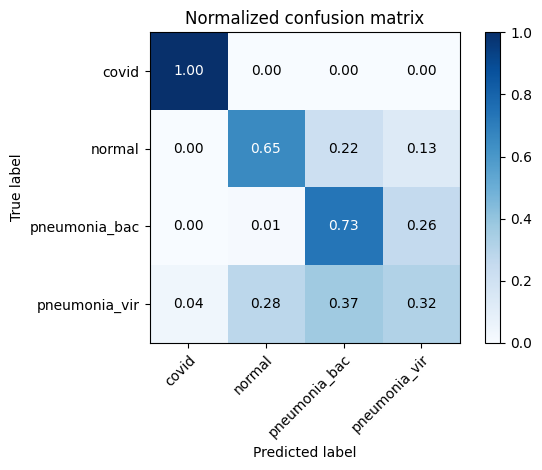

Epoch: [50]  => Evaluation Confusion Matrix Test: [5]
╒══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_50_ep_0.675_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                    │      0.991 │         1     │         0.987 │     0.994 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                   │      0.841 │         0.653 │         0.904 │     0.757 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac            │      0.787 │         0.731 │         0.805 │     0.764 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir            │      0.732 │         0.316 │         0.87  │     0.457 │
╘══════════════════════════╧════════════╧═══════════════╧═══════════════╧═══════════╛


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [51]  => Loss: [1.016]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [52]  => Loss: [1.078]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [53]  => Loss: [1.041]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [54]  => Loss: [1.019]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [55]  => Loss: [1.033]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [56]  => Loss: [1.011]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [57]  => Loss: [0.975]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [58]  => Loss: [1.030]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [59]  => Loss: [1.042]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [60]  => Loss: [1.006]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [60]  => Confusion Matrix Test: [6]  => Total Accuracy over 1800 samples: [0.703]


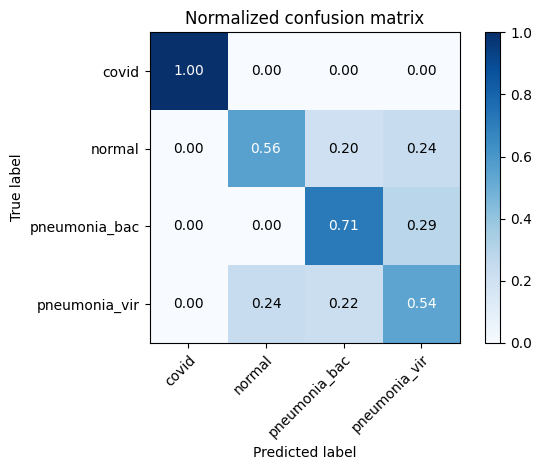

Epoch: [60]  => Evaluation Confusion Matrix Test: [6]
╒══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_60_ep_0.703_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                    │      0.999 │         1     │         0.999 │     1     │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                   │      0.83  │         0.558 │         0.921 │     0.692 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac            │      0.822 │         0.713 │         0.858 │     0.776 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir            │      0.754 │         0.54  │         0.826 │     0.645 │
╘══════════════════════════╧════════════╧═══════════════╧═══════════════╧═══════════╛


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [61]  => Loss: [0.968]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [62]  => Loss: [1.028]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [63]  => Loss: [1.011]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [64]  => Loss: [0.978]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [65]  => Loss: [0.966]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [66]  => Loss: [0.960]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [67]  => Loss: [1.019]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [68]  => Loss: [1.015]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [69]  => Loss: [0.989]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [70]  => Loss: [0.999]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [70]  => Confusion Matrix Test: [7]  => Total Accuracy over 1800 samples: [0.696]


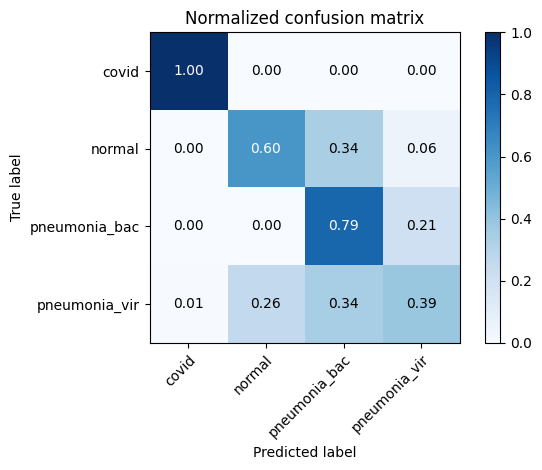

Epoch: [70]  => Evaluation Confusion Matrix Test: [7]
╒══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_70_ep_0.696_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                    │      0.998 │         1     │         0.998 │     0.999 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                   │      0.836 │         0.604 │         0.913 │     0.725 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac            │      0.777 │         0.791 │         0.773 │     0.779 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir            │      0.781 │         0.389 │         0.911 │     0.535 │
╘══════════════════════════╧════════════╧═══════════════╧═══════════════╧═══════════╛


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [71]  => Loss: [0.995]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [72]  => Loss: [1.005]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [73]  => Loss: [0.979]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [74]  => Loss: [0.977]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [75]  => Loss: [0.970]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [76]  => Loss: [0.955]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [77]  => Loss: [0.961]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [78]  => Loss: [0.983]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [79]  => Loss: [0.965]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [80]  => Loss: [0.991]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [80]  => Confusion Matrix Test: [8]  => Total Accuracy over 1800 samples: [0.712]


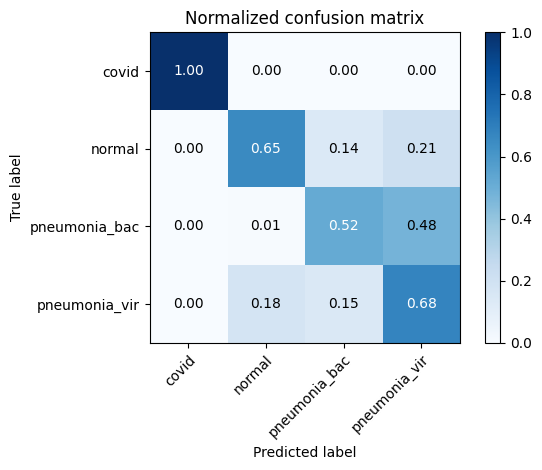

Epoch: [80]  => Evaluation Confusion Matrix Test: [8]
╒══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_80_ep_0.712_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                    │      1     │         1     │         1     │     1     │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                   │      0.867 │         0.653 │         0.939 │     0.765 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac            │      0.808 │         0.518 │         0.904 │     0.649 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir            │      0.748 │         0.676 │         0.773 │     0.716 │
╘══════════════════════════╧════════════╧═══════════════╧═══════════════╧═══════════╛


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [81]  => Loss: [1.010]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [82]  => Loss: [0.986]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [83]  => Loss: [0.956]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [84]  => Loss: [0.966]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [85]  => Loss: [0.985]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [86]  => Loss: [1.018]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [87]  => Loss: [0.979]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [88]  => Loss: [0.976]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [89]  => Loss: [1.006]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [90]  => Loss: [0.948]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [90]  => Confusion Matrix Test: [9]  => Total Accuracy over 1800 samples: [0.697]


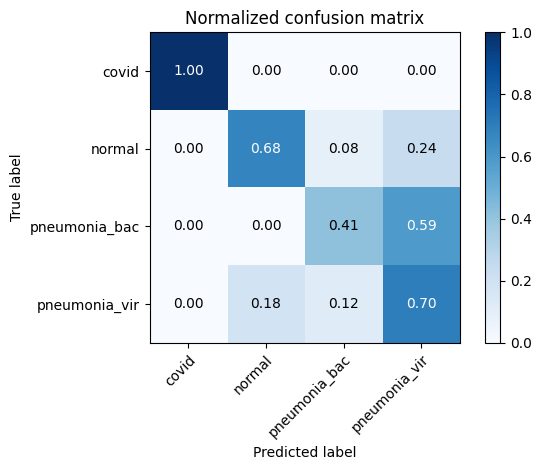

Epoch: [90]  => Evaluation Confusion Matrix Test: [9]
╒══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_90_ep_0.697_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                    │      1     │         1     │         1     │     1     │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                   │      0.873 │         0.676 │         0.939 │     0.781 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac            │      0.803 │         0.413 │         0.933 │     0.563 │
├──────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir            │      0.718 │         0.698 │         0.724 │     0.708 │
╘══════════════════════════╧════════════╧═══════════════╧═══════════════╧═══════════╛


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [91]  => Loss: [0.988]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [92]  => Loss: [0.985]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [93]  => Loss: [0.934]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [94]  => Loss: [0.983]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [95]  => Loss: [0.979]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [96]  => Loss: [0.943]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [97]  => Loss: [0.965]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [98]  => Loss: [0.959]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [99]  => Loss: [0.953]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [100]  => Loss: [0.991]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [100]  => Confusion Matrix Test: [10]  => Total Accuracy over 1800 samples: [0.712]


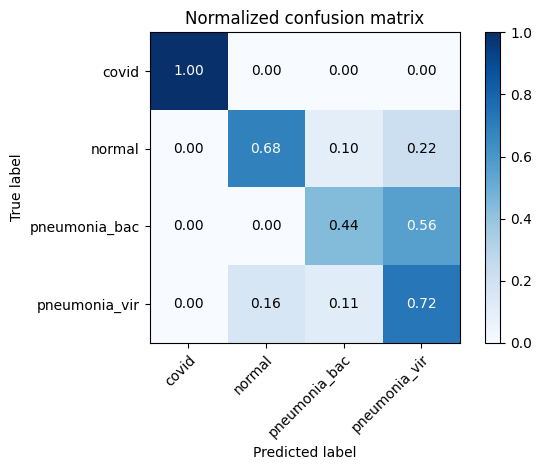

Epoch: [100]  => Evaluation Confusion Matrix Test: [10]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_100_ep_0.712_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      1     │         1     │         1     │     1     │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.88  │         0.684 │         0.945 │     0.788 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.807 │         0.438 │         0.93  │     0.587 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.737 │         0.724 │         0.741 │     0.729 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [101]  => Loss: [0.982]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [102]  => Loss: [0.935]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [103]  => Loss: [0.947]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [104]  => Loss: [0.941]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [105]  => Loss: [0.940]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [106]  => Loss: [0.979]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [107]  => Loss: [0.966]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [108]  => Loss: [0.958]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [109]  => Loss: [0.970]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [110]  => Loss: [0.958]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [110]  => Confusion Matrix Test: [11]  => Total Accuracy over 1800 samples: [0.698]


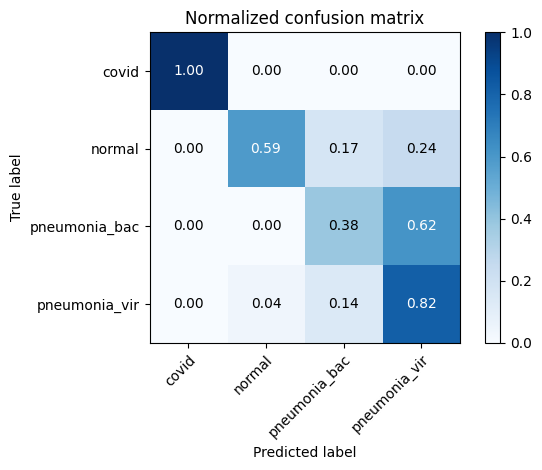

Epoch: [110]  => Evaluation Confusion Matrix Test: [11]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_110_ep_0.698_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      1     │         1     │         1     │     1     │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.887 │         0.589 │         0.986 │     0.731 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.769 │         0.384 │         0.898 │     0.528 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.741 │         0.82  │         0.714 │     0.76  │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [111]  => Loss: [0.919]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [112]  => Loss: [0.986]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [113]  => Loss: [0.929]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [114]  => Loss: [0.962]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [115]  => Loss: [0.942]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [116]  => Loss: [0.943]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [117]  => Loss: [0.983]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [118]  => Loss: [0.978]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [119]  => Loss: [0.976]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [120]  => Loss: [0.978]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [120]  => Confusion Matrix Test: [12]  => Total Accuracy over 1800 samples: [0.759]


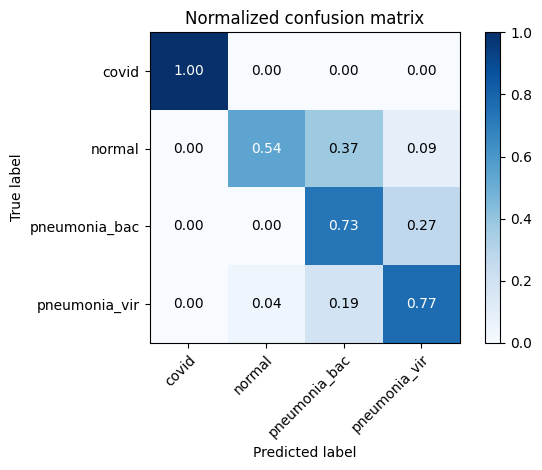

Epoch: [120]  => Evaluation Confusion Matrix Test: [12]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_120_ep_0.759_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      1     │         1     │         1     │     1     │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.873 │         0.54  │         0.984 │     0.694 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.793 │         0.729 │         0.814 │     0.766 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.853 │         0.769 │         0.881 │     0.816 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [121]  => Loss: [0.962]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [122]  => Loss: [1.017]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [123]  => Loss: [0.998]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [124]  => Loss: [0.955]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [125]  => Loss: [0.966]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [126]  => Loss: [0.995]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [127]  => Loss: [0.972]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [128]  => Loss: [1.010]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [129]  => Loss: [1.004]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [130]  => Loss: [0.996]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [130]  => Confusion Matrix Test: [13]  => Total Accuracy over 1800 samples: [0.727]


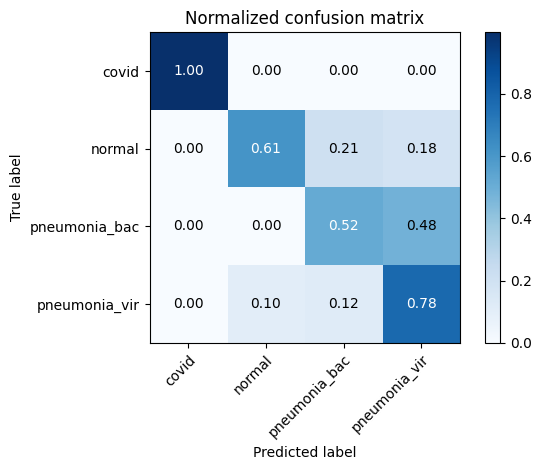

Epoch: [130]  => Evaluation Confusion Matrix Test: [13]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_130_ep_0.727_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.999 │         0.998 │         1     │     0.999 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.877 │         0.613 │         0.964 │     0.748 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.798 │         0.518 │         0.892 │     0.65  │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.779 │         0.778 │         0.779 │     0.776 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [131]  => Loss: [0.951]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [132]  => Loss: [0.988]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [133]  => Loss: [0.959]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [134]  => Loss: [0.946]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [135]  => Loss: [0.950]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [136]  => Loss: [0.987]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [137]  => Loss: [0.961]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [138]  => Loss: [0.948]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [139]  => Loss: [0.950]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [140]  => Loss: [0.945]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [140]  => Confusion Matrix Test: [14]  => Total Accuracy over 1800 samples: [0.754]


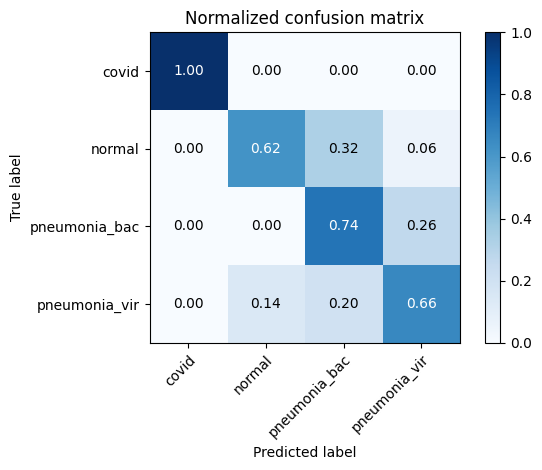

Epoch: [140]  => Evaluation Confusion Matrix Test: [14]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_140_ep_0.754_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      1     │         1     │         1     │     1     │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.869 │         0.62  │         0.953 │     0.749 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.804 │         0.736 │         0.827 │     0.776 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.836 │         0.662 │         0.893 │     0.757 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [141]  => Loss: [0.966]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [142]  => Loss: [0.944]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [143]  => Loss: [0.927]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [144]  => Loss: [0.961]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [145]  => Loss: [0.950]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [146]  => Loss: [0.971]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [147]  => Loss: [0.952]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [148]  => Loss: [0.962]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [149]  => Loss: [0.964]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [150]  => Loss: [0.927]


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: [150]  => Confusion Matrix Test: [15]  => Total Accuracy over 18000 samples: [0.765]


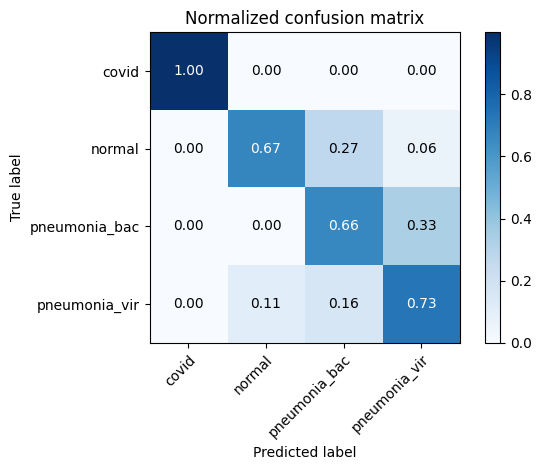

Epoch: [150]  => Evaluation Confusion Matrix Test: [15]


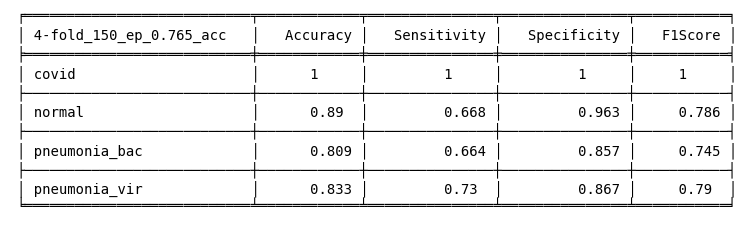

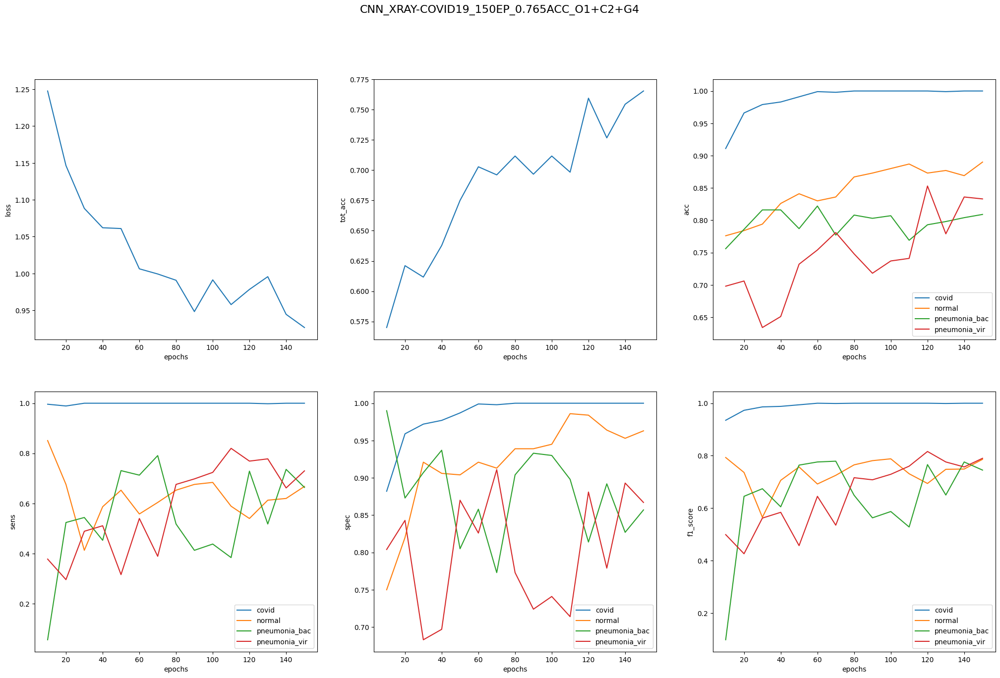

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [151]  => Loss: [0.910]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [152]  => Loss: [0.926]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [153]  => Loss: [0.919]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [154]  => Loss: [0.895]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [155]  => Loss: [0.926]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [156]  => Loss: [0.939]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [157]  => Loss: [0.919]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [158]  => Loss: [0.917]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [159]  => Loss: [0.914]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [160]  => Loss: [0.924]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [160]  => Confusion Matrix Test: [16]  => Total Accuracy over 1800 samples: [0.737]


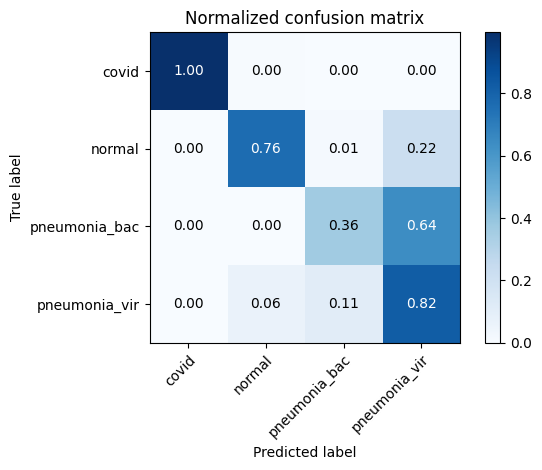

Epoch: [160]  => Evaluation Confusion Matrix Test: [16]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_160_ep_0.737_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.999 │         0.996 │         1     │     0.998 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.924 │         0.764 │         0.977 │     0.856 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.809 │         0.362 │         0.959 │     0.52  │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.741 │         0.824 │         0.713 │     0.764 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [161]  => Loss: [0.919]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [162]  => Loss: [0.950]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [163]  => Loss: [0.917]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [164]  => Loss: [0.889]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [165]  => Loss: [0.926]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [166]  => Loss: [0.906]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [167]  => Loss: [0.912]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [168]  => Loss: [0.964]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [169]  => Loss: [0.957]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [170]  => Loss: [0.890]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [170]  => Confusion Matrix Test: [17]  => Total Accuracy over 1800 samples: [0.805]


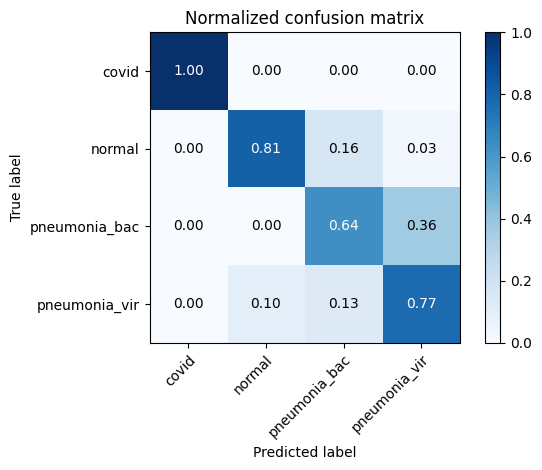

Epoch: [170]  => Evaluation Confusion Matrix Test: [17]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_170_ep_0.805_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      1     │         1     │         1     │     1     │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.928 │         0.811 │         0.967 │     0.88  │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.837 │         0.636 │         0.904 │     0.74  │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.846 │         0.773 │         0.87  │     0.817 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [171]  => Loss: [0.903]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [172]  => Loss: [0.900]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [173]  => Loss: [0.922]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [174]  => Loss: [0.899]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [175]  => Loss: [0.913]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [176]  => Loss: [0.908]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [177]  => Loss: [0.903]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [178]  => Loss: [0.870]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [179]  => Loss: [0.873]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [180]  => Loss: [0.890]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [180]  => Confusion Matrix Test: [18]  => Total Accuracy over 1800 samples: [0.794]


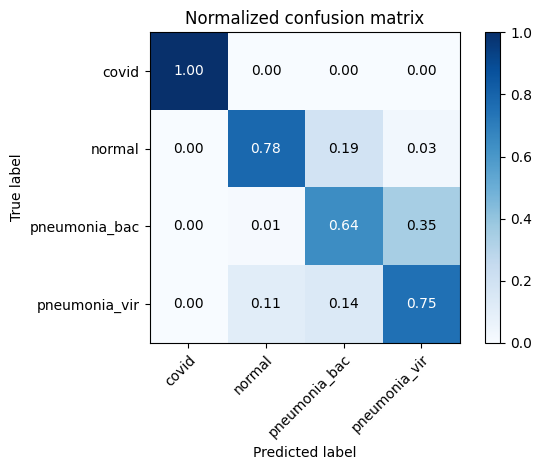

Epoch: [180]  => Evaluation Confusion Matrix Test: [18]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_180_ep_0.794_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      1     │         1     │         1     │     1     │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.916 │         0.784 │         0.96  │     0.859 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.829 │         0.642 │         0.891 │     0.743 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.844 │         0.751 │         0.875 │     0.807 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [181]  => Loss: [0.909]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [182]  => Loss: [0.889]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [183]  => Loss: [0.881]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [184]  => Loss: [0.906]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [185]  => Loss: [0.920]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [186]  => Loss: [0.900]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [187]  => Loss: [0.873]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [188]  => Loss: [0.898]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [189]  => Loss: [0.864]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [190]  => Loss: [0.885]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [190]  => Confusion Matrix Test: [19]  => Total Accuracy over 1800 samples: [0.803]


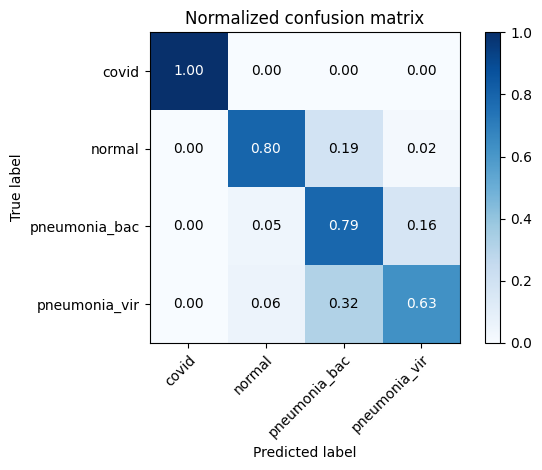

Epoch: [190]  => Evaluation Confusion Matrix Test: [19]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_190_ep_0.803_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      1     │         1     │         1     │     1     │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.923 │         0.796 │         0.966 │     0.871 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.822 │         0.789 │         0.833 │     0.806 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.862 │         0.629 │         0.939 │     0.749 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [191]  => Loss: [0.897]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [192]  => Loss: [0.878]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [193]  => Loss: [0.899]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [194]  => Loss: [0.844]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [195]  => Loss: [0.869]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [196]  => Loss: [0.900]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [197]  => Loss: [0.866]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [198]  => Loss: [0.867]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [199]  => Loss: [0.876]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [200]  => Loss: [0.880]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [200]  => Confusion Matrix Test: [20]  => Total Accuracy over 1800 samples: [0.788]


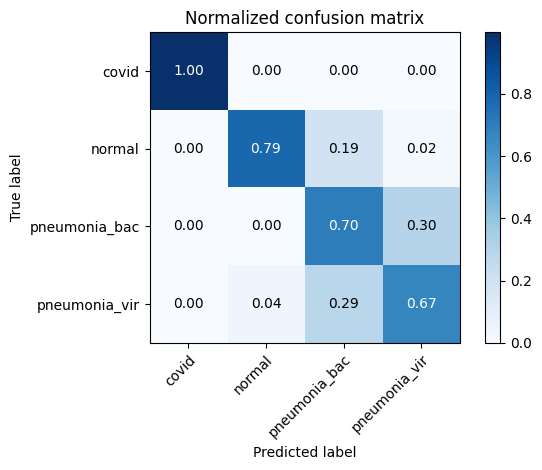

Epoch: [200]  => Evaluation Confusion Matrix Test: [20]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_200_ep_0.788_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.999 │         0.998 │         1     │     0.999 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.935 │         0.787 │         0.984 │     0.871 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.806 │         0.7   │         0.841 │     0.76  │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.837 │         0.669 │         0.893 │     0.761 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [201]  => Loss: [0.910]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [202]  => Loss: [0.886]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [203]  => Loss: [0.901]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [204]  => Loss: [0.904]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [205]  => Loss: [0.881]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [206]  => Loss: [0.906]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [207]  => Loss: [0.863]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [208]  => Loss: [0.904]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [209]  => Loss: [0.908]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [210]  => Loss: [0.880]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [210]  => Confusion Matrix Test: [21]  => Total Accuracy over 1800 samples: [0.809]


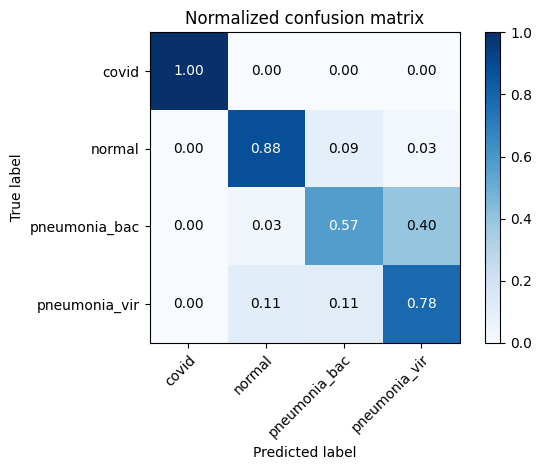

Epoch: [210]  => Evaluation Confusion Matrix Test: [21]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_210_ep_0.809_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.999 │         1     │         0.999 │     1     │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.936 │         0.882 │         0.953 │     0.913 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.843 │         0.571 │         0.933 │     0.704 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.84  │         0.782 │         0.859 │     0.816 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [211]  => Loss: [0.874]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [212]  => Loss: [0.872]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [213]  => Loss: [0.879]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [214]  => Loss: [0.889]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [215]  => Loss: [0.893]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [216]  => Loss: [0.872]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [217]  => Loss: [0.888]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [218]  => Loss: [0.889]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [219]  => Loss: [0.828]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [220]  => Loss: [0.872]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [220]  => Confusion Matrix Test: [22]  => Total Accuracy over 1800 samples: [0.802]


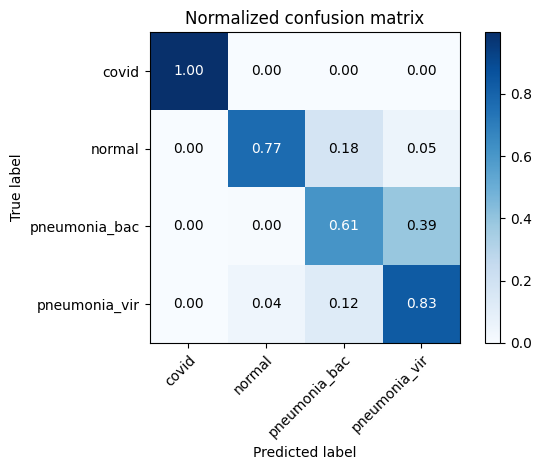

Epoch: [220]  => Evaluation Confusion Matrix Test: [22]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_220_ep_0.802_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.999 │         0.998 │         1     │     0.999 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.93  │         0.771 │         0.983 │     0.862 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.827 │         0.609 │         0.9   │     0.719 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.848 │         0.831 │         0.853 │     0.84  │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [221]  => Loss: [0.858]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [222]  => Loss: [0.874]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [223]  => Loss: [0.890]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [224]  => Loss: [0.875]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [225]  => Loss: [0.885]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [226]  => Loss: [0.888]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [227]  => Loss: [0.847]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [228]  => Loss: [0.859]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [229]  => Loss: [0.860]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [230]  => Loss: [0.871]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [230]  => Confusion Matrix Test: [23]  => Total Accuracy over 1800 samples: [0.795]


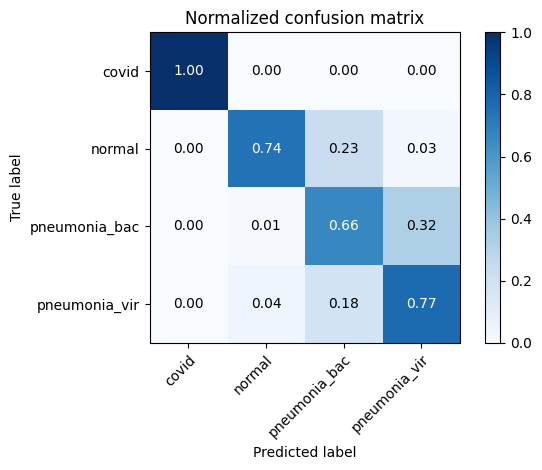

Epoch: [230]  => Evaluation Confusion Matrix Test: [23]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_230_ep_0.795_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      1     │         1     │         1     │     1     │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.922 │         0.742 │         0.982 │     0.842 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.813 │         0.664 │         0.863 │     0.747 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.854 │         0.773 │         0.881 │     0.822 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [231]  => Loss: [0.866]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [232]  => Loss: [0.889]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [233]  => Loss: [0.871]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [234]  => Loss: [0.885]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [235]  => Loss: [0.875]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [236]  => Loss: [0.858]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [237]  => Loss: [0.852]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [238]  => Loss: [0.869]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [239]  => Loss: [0.863]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [240]  => Loss: [0.865]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [240]  => Confusion Matrix Test: [24]  => Total Accuracy over 1800 samples: [0.811]


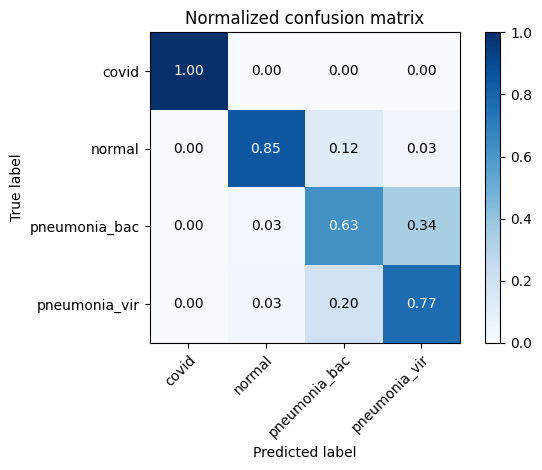

Epoch: [240]  => Evaluation Confusion Matrix Test: [24]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_240_ep_0.811_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      1     │         1     │         1     │     1     │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.946 │         0.849 │         0.979 │     0.907 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.827 │         0.627 │         0.894 │     0.732 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.848 │         0.767 │         0.875 │     0.816 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [241]  => Loss: [0.868]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [242]  => Loss: [0.873]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [243]  => Loss: [0.870]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [244]  => Loss: [0.854]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [245]  => Loss: [0.838]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [246]  => Loss: [0.861]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [247]  => Loss: [0.842]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [248]  => Loss: [0.873]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [249]  => Loss: [0.868]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [250]  => Loss: [0.855]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [250]  => Confusion Matrix Test: [25]  => Total Accuracy over 1800 samples: [0.806]


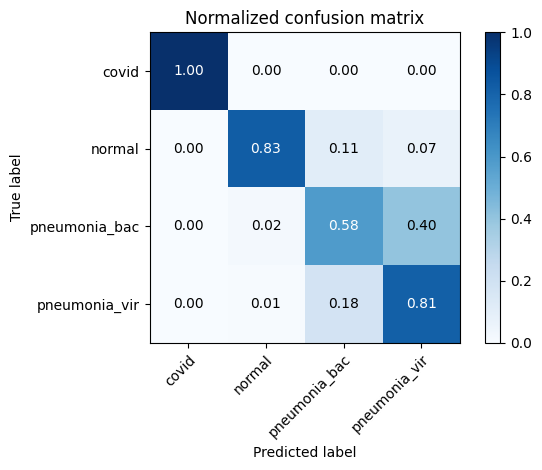

Epoch: [250]  => Evaluation Confusion Matrix Test: [25]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_250_ep_0.806_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      1     │         1     │         1     │     1     │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.951 │         0.827 │         0.992 │     0.9   │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.824 │         0.582 │         0.904 │     0.705 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.837 │         0.813 │         0.844 │     0.827 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [251]  => Loss: [0.864]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [252]  => Loss: [0.847]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [253]  => Loss: [0.867]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [254]  => Loss: [0.866]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [255]  => Loss: [0.868]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [256]  => Loss: [0.859]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [257]  => Loss: [0.874]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [258]  => Loss: [0.851]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [259]  => Loss: [0.855]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [260]  => Loss: [0.846]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [260]  => Confusion Matrix Test: [26]  => Total Accuracy over 1800 samples: [0.874]


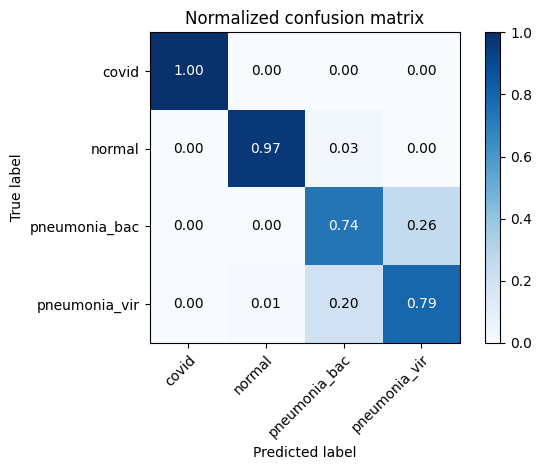

Epoch: [260]  => Evaluation Confusion Matrix Test: [26]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_260_ep_0.874_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      1     │         1     │         1     │     1     │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.988 │         0.967 │         0.995 │     0.98  │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.877 │         0.738 │         0.924 │     0.817 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.883 │         0.791 │         0.913 │     0.846 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [261]  => Loss: [0.880]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [262]  => Loss: [0.865]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [263]  => Loss: [0.864]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [264]  => Loss: [0.873]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [265]  => Loss: [0.843]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [266]  => Loss: [0.844]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [267]  => Loss: [0.866]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [268]  => Loss: [0.877]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [269]  => Loss: [0.852]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [270]  => Loss: [0.849]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [270]  => Confusion Matrix Test: [27]  => Total Accuracy over 1800 samples: [0.794]


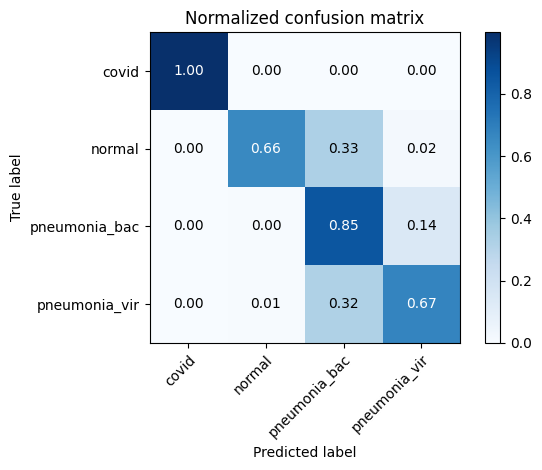

Epoch: [270]  => Evaluation Confusion Matrix Test: [27]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_270_ep_0.794_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.999 │         0.998 │         1     │     0.999 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.911 │         0.656 │         0.996 │     0.787 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.801 │         0.851 │         0.784 │     0.814 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.877 │         0.673 │         0.945 │     0.784 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [271]  => Loss: [0.868]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [272]  => Loss: [0.842]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [273]  => Loss: [0.859]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [274]  => Loss: [0.845]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [275]  => Loss: [0.856]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [276]  => Loss: [0.878]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [277]  => Loss: [0.826]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [278]  => Loss: [0.833]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [279]  => Loss: [0.851]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [280]  => Loss: [0.869]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [280]  => Confusion Matrix Test: [28]  => Total Accuracy over 1800 samples: [0.812]


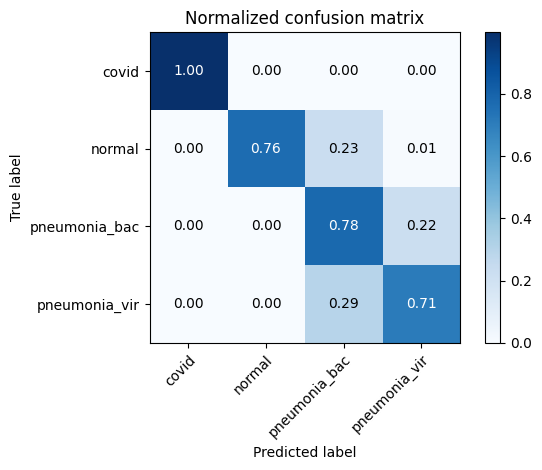

Epoch: [280]  => Evaluation Confusion Matrix Test: [28]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_280_ep_0.812_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      0.999 │         0.998 │         1     │     0.999 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.941 │         0.764 │         0.999 │     0.864 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.814 │         0.778 │         0.826 │     0.799 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.869 │         0.707 │         0.924 │     0.799 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [281]  => Loss: [0.864]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [282]  => Loss: [0.847]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [283]  => Loss: [0.846]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [284]  => Loss: [0.837]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [285]  => Loss: [0.883]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [286]  => Loss: [0.837]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [287]  => Loss: [0.864]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [288]  => Loss: [0.844]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [289]  => Loss: [0.853]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [290]  => Loss: [0.846]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [290]  => Confusion Matrix Test: [29]  => Total Accuracy over 1800 samples: [0.853]


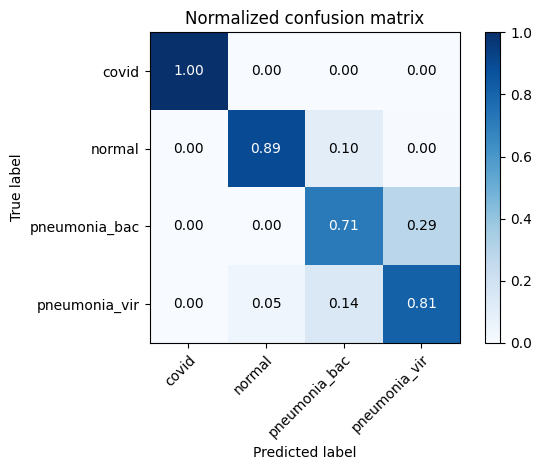

Epoch: [290]  => Evaluation Confusion Matrix Test: [29]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_290_ep_0.853_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      1     │         1     │         1     │     1     │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.961 │         0.891 │         0.984 │     0.934 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.866 │         0.711 │         0.917 │     0.798 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.879 │         0.809 │         0.903 │     0.852 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [291]  => Loss: [0.845]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [292]  => Loss: [0.841]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [293]  => Loss: [0.824]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [294]  => Loss: [0.852]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [295]  => Loss: [0.844]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [296]  => Loss: [0.827]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [297]  => Loss: [0.849]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [298]  => Loss: [0.828]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [299]  => Loss: [0.829]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [300]  => Loss: [0.821]


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: [300]  => Confusion Matrix Test: [30]  => Total Accuracy over 18000 samples: [0.818]


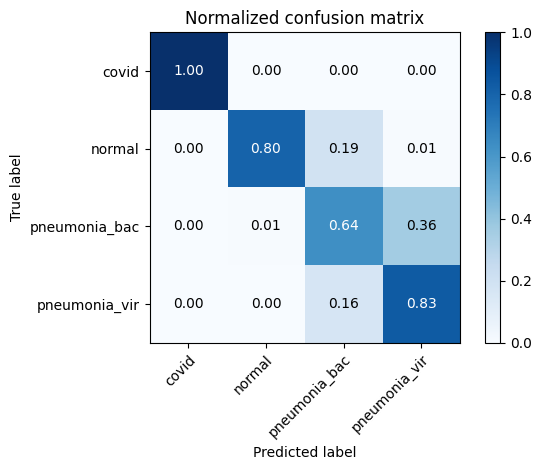

Epoch: [300]  => Evaluation Confusion Matrix Test: [30]


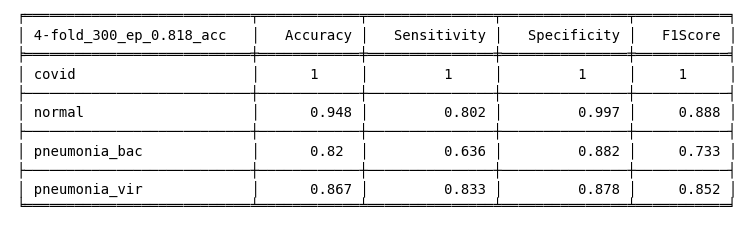

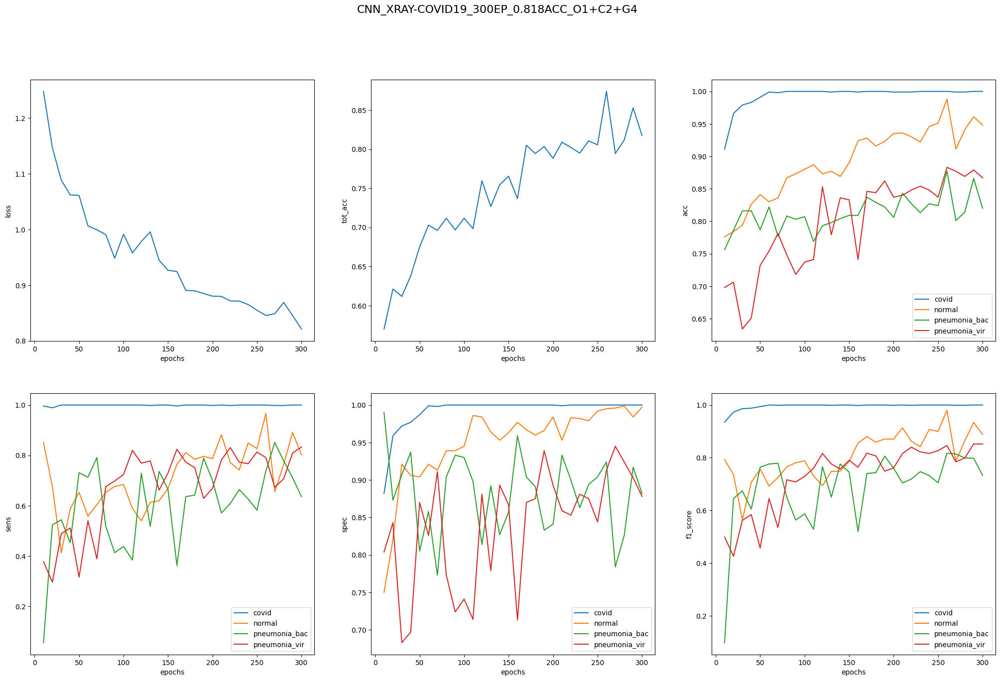

Finished Training


In [35]:

net=CNN(hidden_size, channels_size, class_number).cuda()
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=lr, momentum=m)

isttrainset =  listtrainset_gan

trainset_concat = torch.utils.data.ConcatDataset(listtrainset)

sampler = torch.utils.data.RandomSampler(trainset_concat,replacement=True, num_samples=num_samples)

trainloader = torch.utils.data.DataLoader(trainset_concat,  sampler=sampler,
                                          batch_size=batch_size_train, drop_last=True)

for epoch in range(epochs):  # loop over the dataset multiple times

    running_loss = 0.0
    for data in notebook.tqdm(trainloader):
        # get the inputs; data is a list of [inputs, labels]
        
        gc.collect()
        if torch.cuda.is_available():
            inputs, labels = data[0].cuda(), data[1].cuda()  
        else:
            inputs, labels = data[0].to(device), data[1].to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
    print("Epoch: [%d]"%(epoch + 1),' => Loss: [%.3f]' %(running_loss / len(trainloader)))
    if (epoch+1)%10==0:
        with torch.no_grad():
            metrics['loss'].append([epoch+1, (running_loss / len(trainloader))])
            accuracy_tot = list(0. for i in range(len(classes)))
            sensitivity_tot = list(0. for i in range(len(classes)))
            specificity_tot = list(0. for i in range(len(classes)))
            f1score_tot = list(0. for i in range(len(classes)))
            table = list(0. for i in range(len(classes)))
            tot_acc_tot=0

            iterations=50
            if (epoch+1)%150==0:
              iterations=500
  
            labels_tot=np.array([],dtype=np.uint8)
            predicted_tot=np.array([],dtype=np.uint8)

            for i in notebook.tqdm(range(iterations)):

              dataiter = iter(testloader)
              images, labels = next(dataiter)

       

              outputs = net(images.to(device))

              _, predicted = torch.max(outputs, 1)

              labels_tot=np.append(labels_tot,labels.cpu().detach().numpy())
              predicted_tot=np.append(predicted_tot,predicted.cpu().detach().numpy())

              cm = confusion_matrix(labels.cpu().detach().numpy(), predicted.cpu().detach().numpy(), labels=None, sample_weight=None)

              tot_acc=np.trace(cm)/np.sum(cm)

              tot_acc_tot+=tot_acc

              sensitivity = list(0. for i in range(cm.shape[0]))
              specificity = list(0. for i in range(cm.shape[0]))
              accuracy = list(0. for i in range(cm.shape[0]))
              f1score = list(0. for i in range(cm.shape[0]))

              for i in range(cm.shape[0]):
                TP = cm[i,i]
                FN = np.sum(cm[i,:]) - TP
                FP = np.sum(cm[:,i]) - TP
                TN = (np.sum(cm) - TP - FP - FN)
                accuracy[i] = (TP + TN) / (TP + TN + FP + FN) 
                sensitivity[i] = TP / (TP + FN) 
                specificity[i] = TN / (TN + FP) 
                f1score[i]= 2 * (specificity[i] * sensitivity[i]) / (specificity[i] + sensitivity[i])
              accuracy_tot = [sum(x) for x in zip(accuracy_tot, accuracy)]
              specificity_tot = [sum(x) for x in zip(specificity_tot, specificity)]
              sensitivity_tot = [sum(x) for x in zip(sensitivity_tot, sensitivity)]
              f1score_tot = [sum(x) for x in zip(f1score_tot, f1score)]
              
            accuracy_tot = [round((x/iterations),3) for x in accuracy_tot]
            specificity_tot = [round((x/iterations),3) for x in specificity_tot]
            sensitivity_tot = [round((x/iterations),3) for x in sensitivity_tot]
            f1score_tot = [round((x/iterations),3) for x in f1score_tot]
            tot_acc_tot/=iterations
            running_loss/=(iterations*len(testloader))

            metrics['tot_acc'].append([epoch+1, tot_acc_tot])
            metrics['acc'].append([epoch+1, accuracy_tot])
            metrics['spec'].append([epoch+1, specificity_tot])
            metrics['sens'].append([epoch+1, sensitivity_tot])
            metrics['f1_score'].append([epoch+1, f1score_tot])

            table=[classes, accuracy_tot, sensitivity_tot, specificity_tot, f1score_tot]
            table=np.array(table).T.tolist()

            plot_confusion_matrix(labels_tot, predicted_tot, classes=np.asarray(classes), normalize=True)
            
            print("Epoch: [%d]"%(epoch + 1)," => Confusion Matrix Test: [%d]" %(int((epoch+1)/10))," => Total Accuracy over %d samples: [%.3f]" %(len(testloader.dataset)*iterations, tot_acc_tot))

            if (epoch+1)%150==0:
              plt.gcf().savefig( results_folder + name_new_folder +'/plots/confusion_matrix_%d_ep_%.3f_acc.png' % ((epoch + 1),tot_acc_tot))
            
            plt.show()

            print("Epoch: [%d]"%(epoch + 1)," => Evaluation Confusion Matrix Test: [%d]" %(int((epoch+1)/10)))

            tab = tabulate(table, headers=['%d-fold_%d_ep_%.3f_acc' % (len(classes),(epoch + 1),tot_acc_tot),'Accuracy','Sensitivity', 'Specificity', 'F1Score'], tablefmt='fancy_grid')

            if (epoch+1)%150==0:
              plt.figure(figsize=(8,2.5))
              plt.text(0.01, 0.05, tab, {'fontsize': 10}, fontproperties = 'monospace') 
              plt.axis('off')
              plt.tight_layout()
              plt.savefig( results_folder + name_new_folder +'/plots/k_fold_%d_ep_%.3f_acc.png' % ((epoch + 1),tot_acc_tot))
              plt.show()
            else:
              print(tab)

            if (epoch+1)%150==0:
              PATH = results_folder + name_new_folder +'/models/'
              NAME = 'CNN_XRAY-COVID19_'+str(epoch+1)+'EP_'+str(round(tot_acc_tot,3))+'ACC_O'+str(len(listtrainset_no_aug))+'+C'+str(len(listtrainset_classic))+'+G'+str(len(listtrainset_gan))
              EXT = '.pth'
              states = {
                      'state_dict': net.state_dict(),
                      'optimizer': optimizer.state_dict(),
                      'device': device,
                      'classes': classes,
                      'metrics': metrics,
                      'train_epoch': epoch+1,
                      'dataset_code': 'O'+str(len(listtrainset_no_aug))+'+C'+str(len(listtrainset_classic))+'+G'+str(len(listtrainset_gan)),
                      'dataset_length': len(trainloader.dataset),
                      'batch': num_samples,
                      'mini-batch': batch_size_train,
                      'img_dim': (img_dim,img_dim,channels_size),
                      'date': dt.datetime.now().strftime("%Y-%m-%d_%H:%M:%S"),
              }
              torch.save(states, PATH+NAME+EXT)
              fig = plt.figure(figsize=(25,15))
              fig.suptitle(NAME, fontsize=16)
              fig.subplots_adjust(hspace=0.2, wspace=0.2)
              for i in range(1, len(METRIC_FIELDS)+1):
                  ax = fig.add_subplot(2, 3, i)
                  if type(metrics[METRIC_FIELDS[i-1]][1][1])==list:
                    for j in range(len(classes)):
                      ax.plot([x[0] for x in metrics[METRIC_FIELDS[i-1]]],[x[1][j] for x in metrics[METRIC_FIELDS[i-1]]], label=classes[j])
                    ax.legend()
                  else:
                    ax.plot([x[0] for x in metrics[METRIC_FIELDS[i-1]]],[x[1] for x in metrics[METRIC_FIELDS[i-1]]])
                  ax.set(ylabel=METRIC_FIELDS[i-1],xlabel='epochs')
              get_fig = plt.gcf()
              get_fig.savefig( results_folder + name_new_folder +'/plots/%s.png' % (NAME))
              plt.show()

            if (epoch)%150==0:
              clear_output()
              
    running_loss = 0.0
print('Finished Training')
